# Latent space of anomalies

In [3]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import tensorflow as tf
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

def load_sensor(ramp_num, dir_path, sensor, time_range = None):
    """
    Load a sensor's data in the specified time range.
    
    Example usage: load_sensor("Ramp_7", "15T_data", 0, time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - sensor (int): sensor index (0 or 1)
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified sensor in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num + '-'):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    df_data = pd.DataFrame(data = {"dummy": data[sensor, :][selection_index]})
    
    #Return the sensor's data accoring to the index 
    return df_data["dummy"]
    
    %reset -f in
    
def load_time_label(ramp_num, dir_path, time_range = None, window = 2000, step = 10):
    """
    Load a ramp time axis in a specified range.
    
    Example usage: load_time_label("Ramp_7", "15T_data", time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified time axis in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num + '-'):
            needed_file = dir_path + "/" + filename

    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    %reset -f in
    
    return time_axis[selection_index][window-1::step]


#### Mean of abs(signal)
def generate_mean_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1, product)).transpose()
    
    %reset -f in
    
    return all_sd

def generate_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(ramp_num, dir_path, time_range, window = window, step = step)
    moving_sd = generate_sd_data(ramp_num, dir_path, time_range, window = window, step = step)
    time_label = load_time_label(ramp_num, dir_path, time_range, window = window, step = step)
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label


############DYNAMIC LEARNING IMPLEMENTATION############
def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(4, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=6))

    model.add(Dense(2,activation='elu',
                    kernel_initializer='glorot_uniform', name = 'latent_space'))

    model.add(Dense(4,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def get_latent_output(model_weights, X):
    
    model = create_model()  # create the original model
    model.set_weights(model_weights)

    layer_name = 'latent_space'
    intermediate_layer_model = keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    intermediate_layer_model.compile(loss='mse',optimizer='adam')
    
    intermediate_output = intermediate_layer_model.predict(X)
    
    return intermediate_output

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Get latent space output
    latent_space = get_latent_output(current_weights, X_test)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks]), [list(x) for x in list(latent_space[peaks])]
    
    else:
        return None, None
    

def simulation(ramp_num, dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(ramp_num, dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Keep track of latent coordinate of trigger time
    latent_coor = []
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 3, end_thres = 1.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            
            
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time, trigger_latent = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
                
                print("Latent coordinates are: ", trigger_latent)
                latent_coor.extend(trigger_latent)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)
    print()
    print("All latent coordinate: ", latent_coor)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2499800, 6)
Flushing input history
Number of sections: 25
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-250, -240)
-------->
Entering sections:  (-240, -230)
-------->
Training for section:  (None, -240)


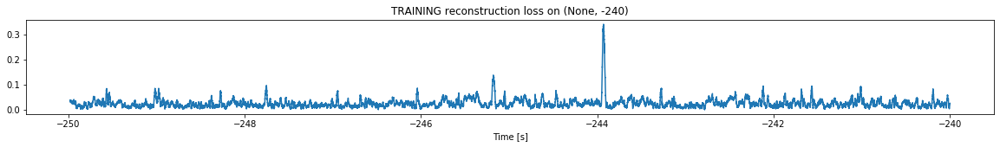

Finished training, median of the log(loss) is:  -1.6575864436919492
<--------
Entering sections:  (-230, -220)
-------->
Training for section:  (-240, -230)


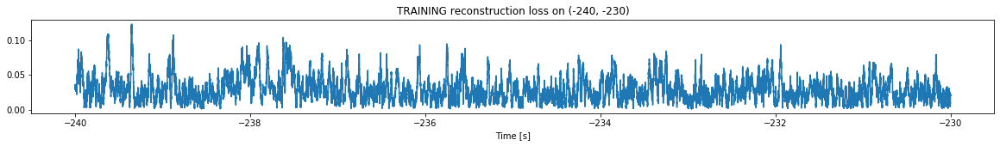

Finished training, median of the log(loss) is:  -1.6022525956003382
Triggering for section:  (-230, -220)
Using this median for triggering: -1.6575864436919492
Triggering threshold is:  3.0


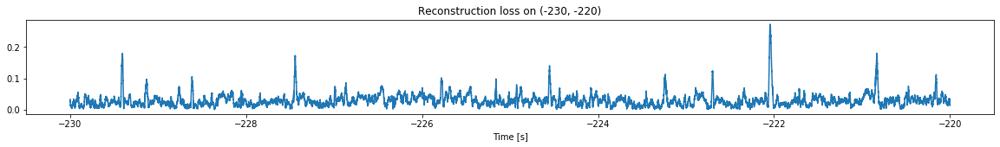

<--------
Entering sections:  (-220, -210)
-------->
Training for section:  (-230, -220)


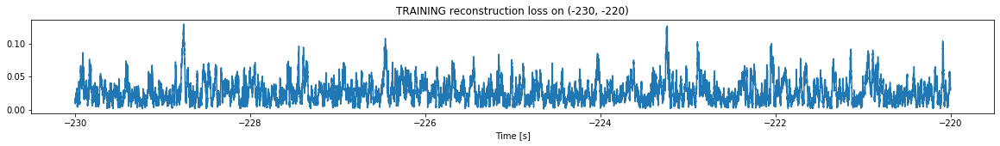

Finished training, median of the log(loss) is:  -1.6273330973369047
Triggering for section:  (-220, -210)
Using this median for triggering: -1.6022525956003382
Triggering threshold is:  2.3


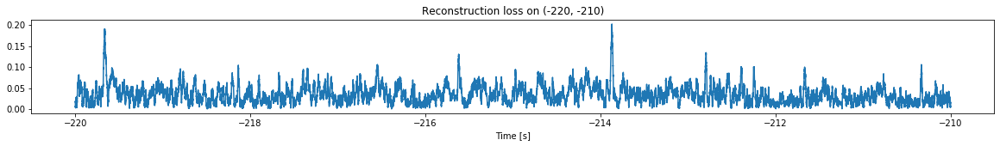

<--------
Entering sections:  (-210, -200)
-------->
Training for section:  (-220, -210)


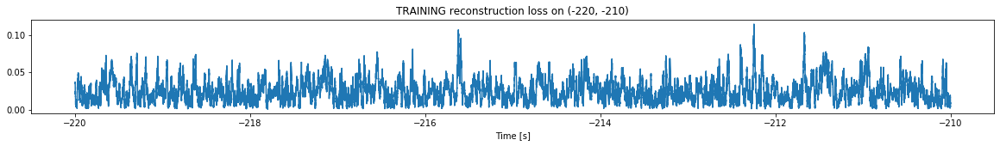

Finished training, median of the log(loss) is:  -1.6532006426253423
Triggering for section:  (-210, -200)
Using this median for triggering: -1.6273330973369047
Triggering threshold is:  1.6


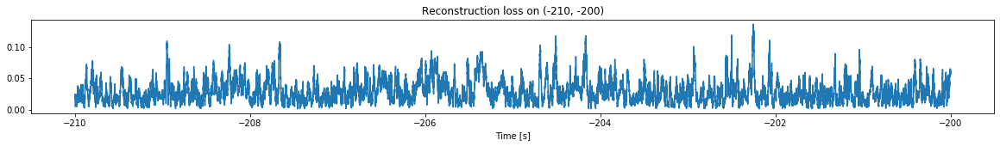

<--------
Entering sections:  (-200, -190)
-------->
Training for section:  (-210, -200)


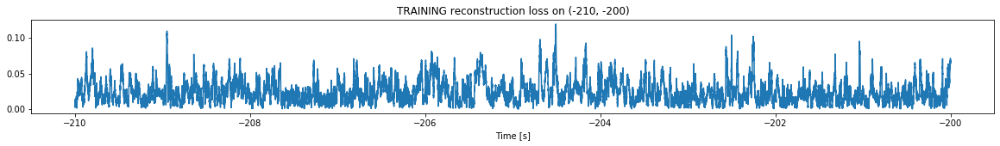

Finished training, median of the log(loss) is:  -1.6718475132219988
Triggering for section:  (-200, -190)
Using this median for triggering: -1.6532006426253423
Triggering threshold is:  1.6


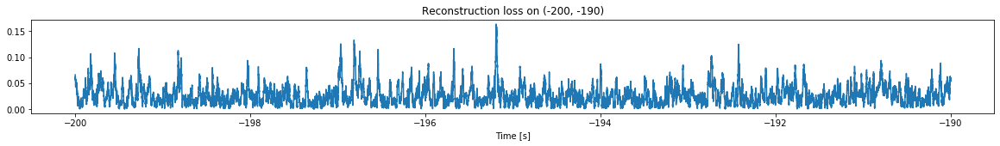

<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


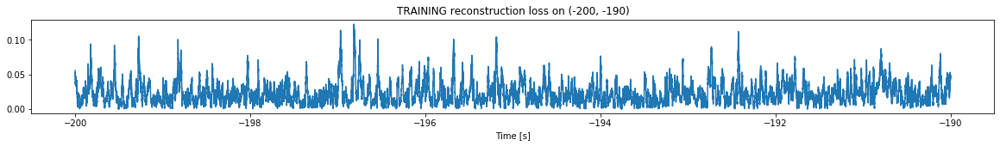

Finished training, median of the log(loss) is:  -1.711036627710819
Triggering for section:  (-190, -180)
Using this median for triggering: -1.6718475132219988
Triggering threshold is:  1.6


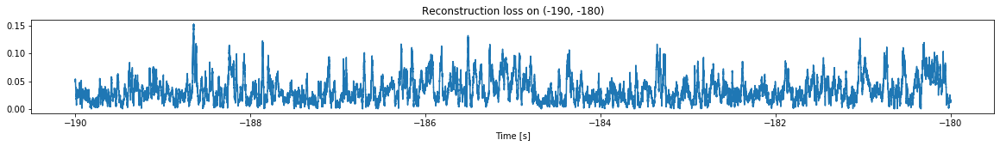

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


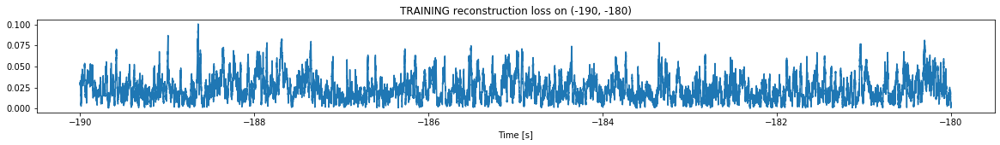

Finished training, median of the log(loss) is:  -1.6893620695814386
Triggering for section:  (-180, -170)
Using this median for triggering: -1.711036627710819
Triggering threshold is:  1.6


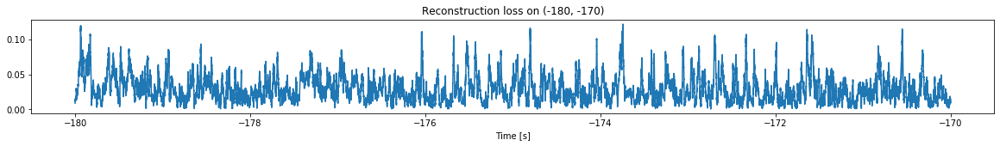

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


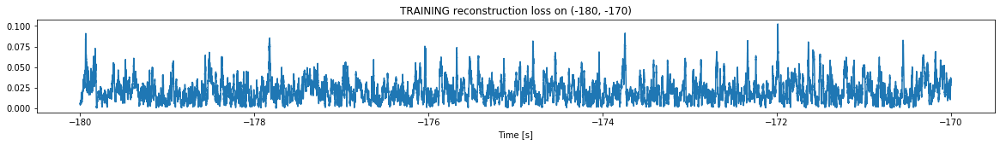

Finished training, median of the log(loss) is:  -1.7373083221727825
Triggering for section:  (-170, -160)
Using this median for triggering: -1.6893620695814386
Triggering threshold is:  1.6


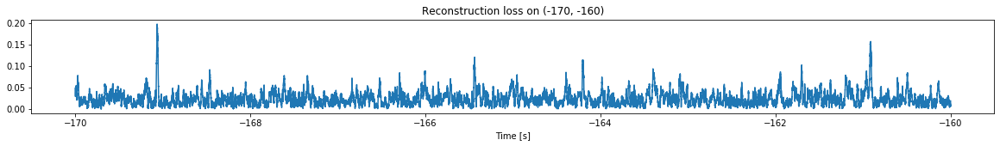

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


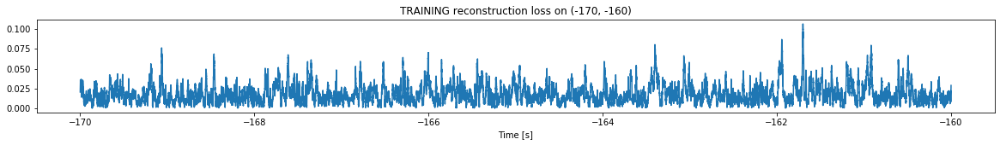

Finished training, median of the log(loss) is:  -1.8024541714836086
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7373083221727825
Triggering threshold is:  1.6


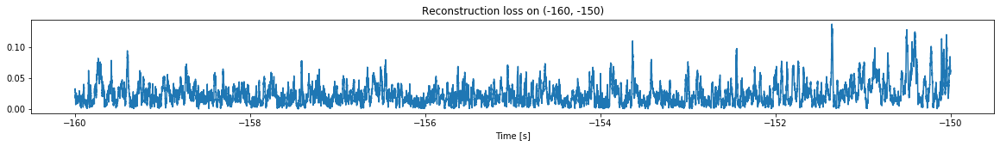

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


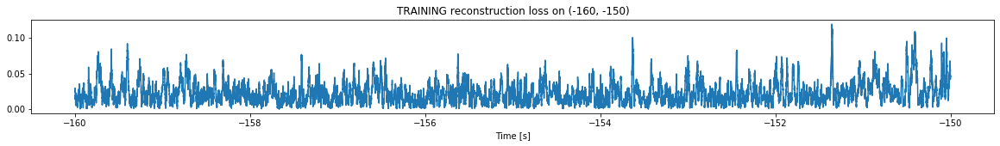

Finished training, median of the log(loss) is:  -1.7138510458195737
Triggering for section:  (-150, -140)
Using this median for triggering: -1.8024541714836086
Triggering threshold is:  1.6


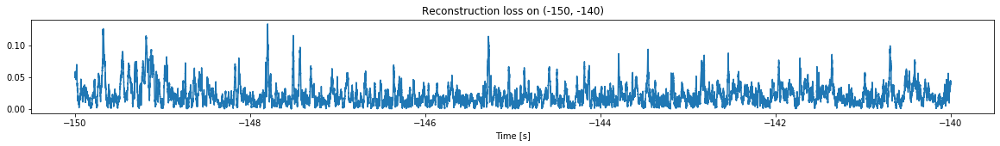

<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


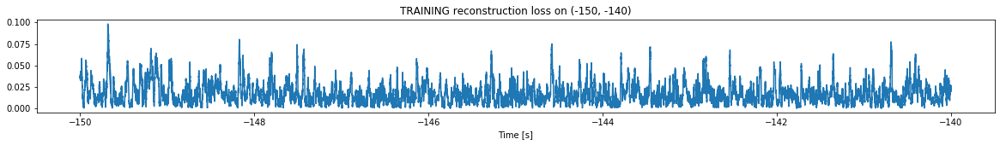

Finished training, median of the log(loss) is:  -1.8319138543328513
Triggering for section:  (-140, -130)
Using this median for triggering: -1.7138510458195737
Triggering threshold is:  1.6


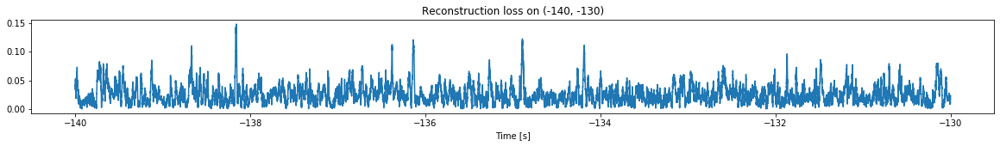

<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


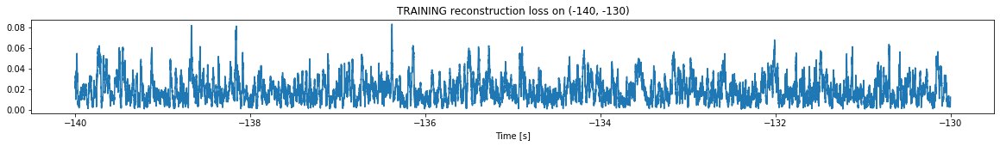

Finished training, median of the log(loss) is:  -1.7794004423610255
Triggering for section:  (-130, -120)
Using this median for triggering: -1.8319138543328513
Triggering threshold is:  1.6


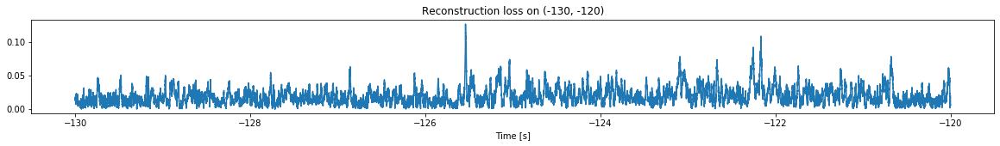

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


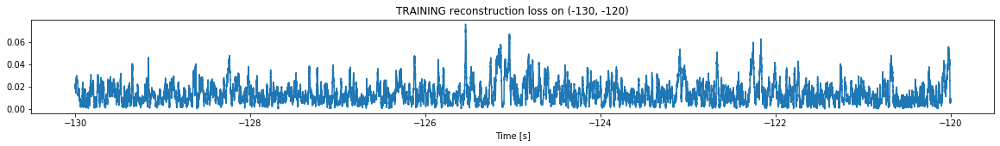

Finished training, median of the log(loss) is:  -1.9244556764964376
Triggering for section:  (-120, -110)
Using this median for triggering: -1.7794004423610255
Triggering threshold is:  1.6


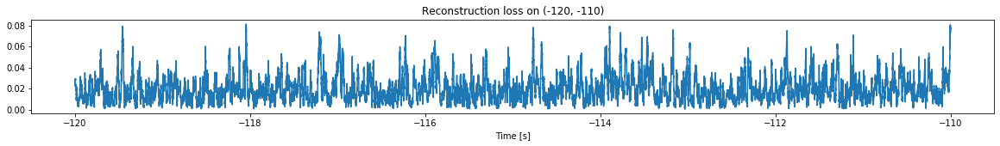

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


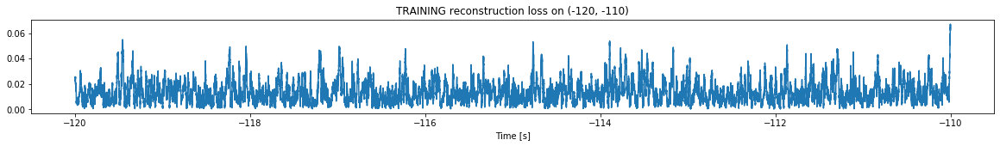

Finished training, median of the log(loss) is:  -1.910586501801309
Triggering for section:  (-110, -100)
Using this median for triggering: -1.9244556764964376
Triggering threshold is:  1.6


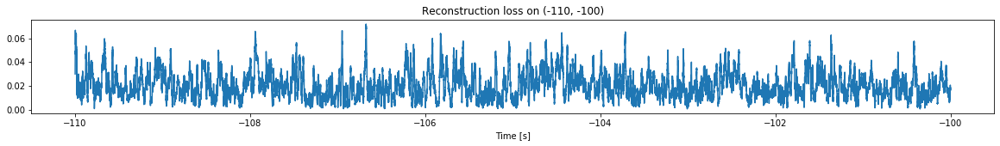

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


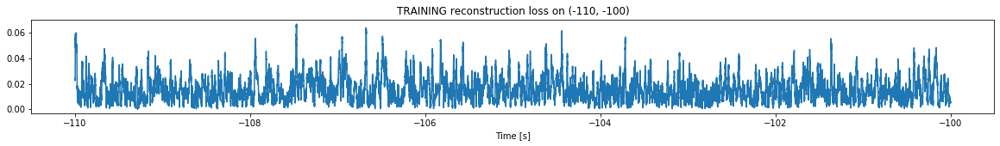

Finished training, median of the log(loss) is:  -1.8590334377309616
Triggering for section:  (-100, -90)
Using this median for triggering: -1.910586501801309
Triggering threshold is:  1.6


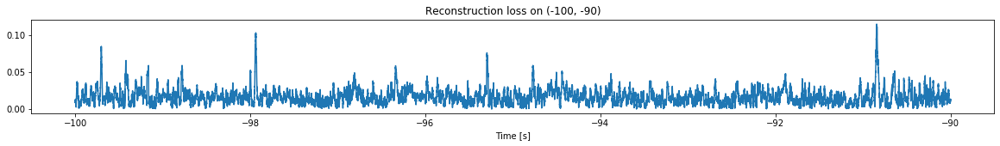

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


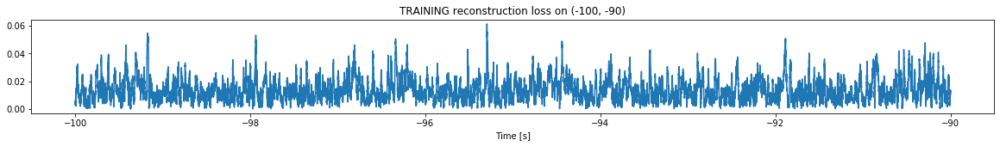

Finished training, median of the log(loss) is:  -1.906989051450393
Triggering for section:  (-90, -80)
Using this median for triggering: -1.8590334377309616
Triggering threshold is:  1.6


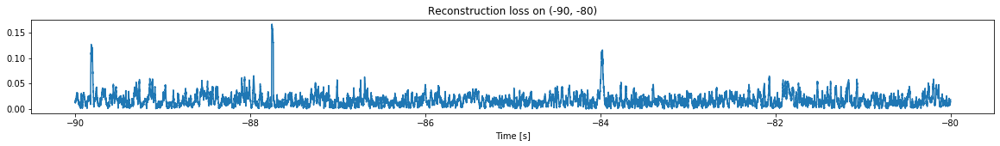

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


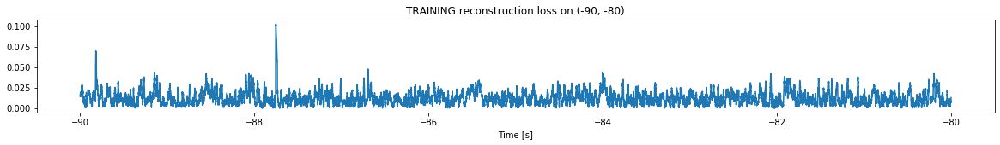

Finished training, median of the log(loss) is:  -1.9457380254846735
Triggering for section:  (-80, -70)
Using this median for triggering: -1.906989051450393
Triggering threshold is:  1.6


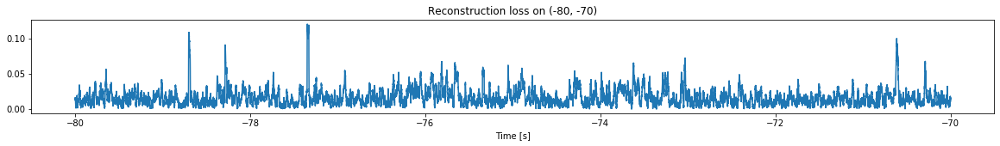

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


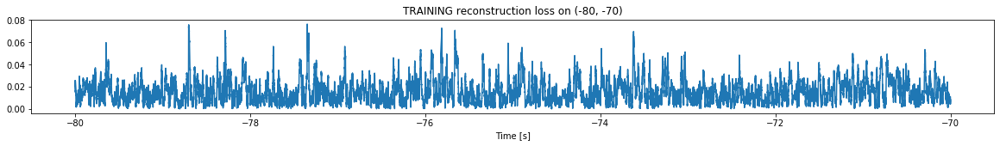

Finished training, median of the log(loss) is:  -1.8511000472394077
Triggering for section:  (-70, -60)
Using this median for triggering: -1.9457380254846735
Triggering threshold is:  1.6


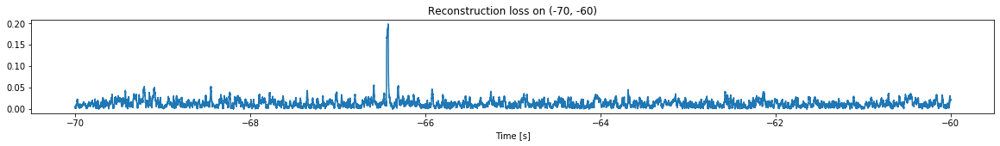

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


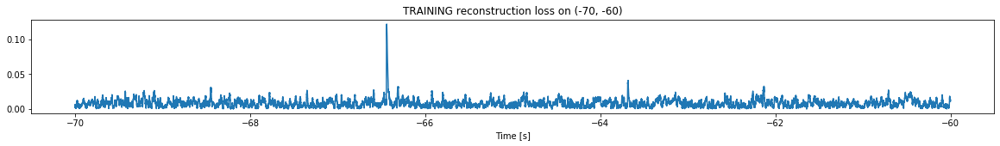

Finished training, median of the log(loss) is:  -2.11522755568943
Triggering for section:  (-60, -50)
Using this median for triggering: -1.8511000472394077
Triggering threshold is:  1.6


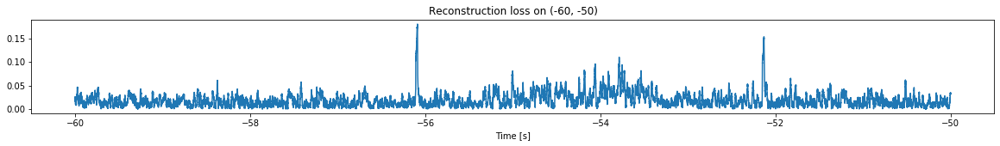

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


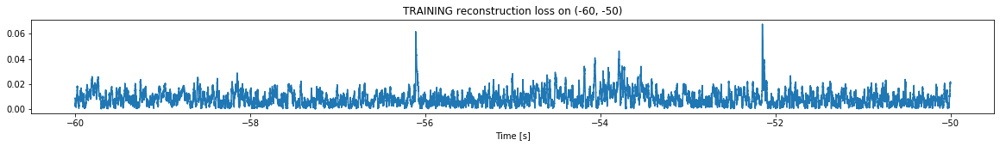

Finished training, median of the log(loss) is:  -2.1123766402886135
Triggering for section:  (-50, -40)
Using this median for triggering: -2.11522755568943
Triggering threshold is:  1.6


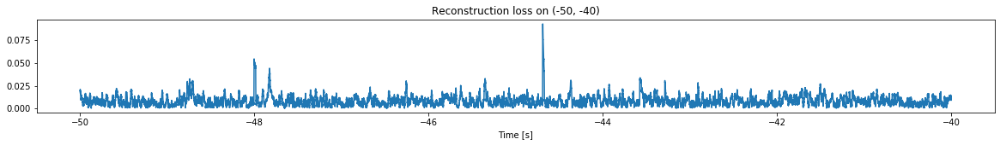

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


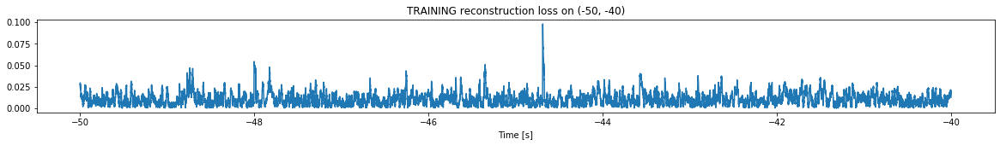

Finished training, median of the log(loss) is:  -2.014026411558442
Triggering for section:  (-40, -30)
Using this median for triggering: -2.1123766402886135
Triggering threshold is:  1.6


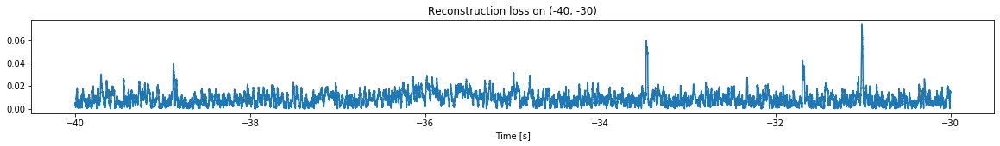

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


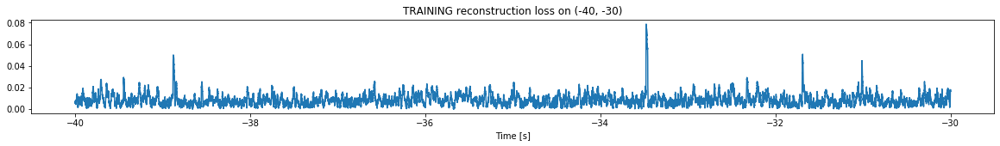

Finished training, median of the log(loss) is:  -2.1106262932957947
Triggering for section:  (-30, -20)
Using this median for triggering: -2.014026411558442
Triggering threshold is:  1.6


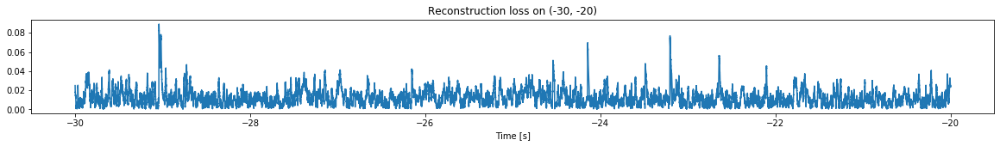

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


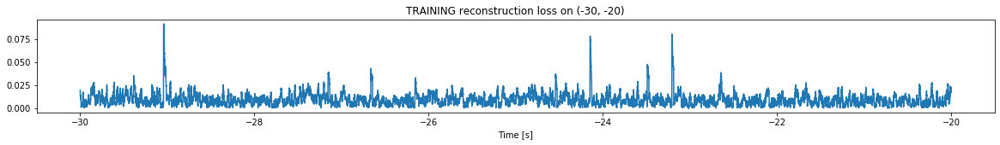

Finished training, median of the log(loss) is:  -2.0676325482770874
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1106262932957947
Triggering threshold is:  1.6


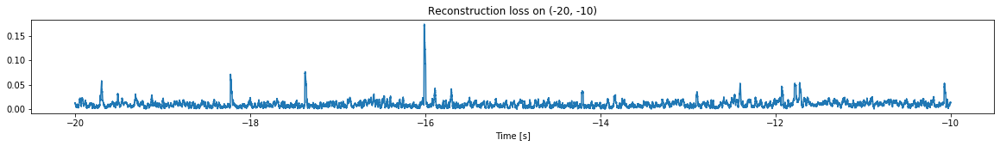

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


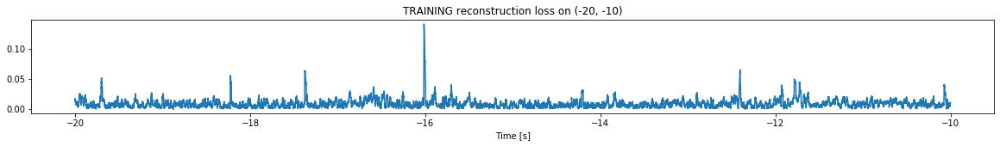

Finished training, median of the log(loss) is:  -2.11551182230962
Triggering for section:  (-10, 0)
Using this median for triggering: -2.0676325482770874
Triggering threshold is:  1.6


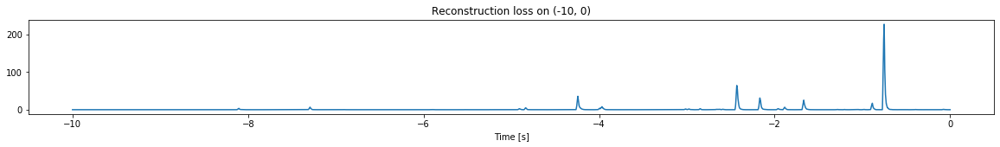

Other trigger time:  [-8.10439   -7.29349   -5.9109898 -4.83739   -4.24249   -3.6989899
 -3.0147898 -2.43099   -1.6677899 -0.75219   -0.07499  ]
Their log loss values are:  [2.61978414 2.90035773 1.62705698 2.77080318 3.61902787 1.64665861
 2.39782825 3.87669079 3.47336778 4.4242781  2.04680904]


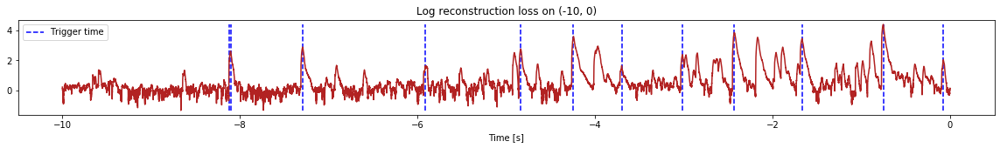

Triggered at:  [-8.10439, -7.29349, -5.9109898, -4.83739, -4.24249, -3.6989899, -3.0147898, -2.43099, -1.6677899, -0.75219, -0.07499]
Latent coordinates are:  [[3.6244817, 41.105335], [7.25784, 62.36469], [2.2284782, 11.505366], [7.755621, 50.634464], [19.333372, 226.08217], [2.6627264, 11.955329], [4.8397064, 29.239836], [40.838367, 365.57687], [15.268868, 172.1873], [111.76777, 1122.3679], [2.5351248, 18.352226]]
<--------
Finished simulation, all the triggered times are:  [-8.10439, -7.29349, -5.9109898, -4.83739, -4.24249, -3.6989899, -3.0147898, -2.43099, -1.6677899, -0.75219, -0.07499]

All latent coordinate:  [[3.6244817, 41.105335], [7.25784, 62.36469], [2.2284782, 11.505366], [7.755621, 50.634464], [19.333372, 226.08217], [2.6627264, 11.955329], [4.8397064, 29.239836], [40.838367, 365.57687], [15.268868, 172.1873], [111.76777, 1122.3679], [2.5351248, 18.352226]]


In [4]:
simulation("Ramp_1", "15T_data", 10,  time_range = (-250,0), reached_max = -200)

In [2]:
#simulation("Ramp_2", "15T_data", 10,  time_range = (-60,0), reached_max = -19.7)

In [3]:
#simulation("Ramp_3", "15T_data", 10,  time_range = (-60,0), reached_max = -17)

In [4]:
#simulation("Ramp_4", "15T_data", 10,  time_range = (-50,0), reached_max = -6.3)

In [5]:
#simulation("Ramp_5", "15T_data", 10,  time_range = (-50,0), reached_max = -2.55)

In [6]:
#simulation("Ramp_6", "15T_data", 10,  time_range = (-50,0), reached_max = -2.8)

In [7]:
#simulation("Ramp_7", "15T_data", 10,  time_range = (-50,0), reached_max = -6.15)

In [8]:
#simulation("Ramp_8", "15T_data", 10,  time_range = (-50,0), reached_max = -2.2)

In [9]:
#simulation("Ramp_10", "15T_data", 10,  time_range = (-50,0), reached_max = -2.75)

In [10]:
#simulation("Ramp_11", "15T_data", 10,  time_range = (-50,0), reached_max = -1.95)

In [11]:
#simulation("Ramp_12", "15T_data", 10,  time_range = (-50,0), reached_max = -4.95)

In [12]:
#simulation("Ramp_19", "15T_data", 10,  time_range = (-50,0), reached_max = -2.15)

In [13]:
#simulation("Ramp_40", "15T_data", 10,  time_range = (-50,0), reached_max = -1.95)

In [14]:
#simulation("Ramp_42", "15T_data", 10,  time_range = (-50,0), reached_max = -0.5)

In [15]:
#simulation("Ramp_43", "15T_data", 10,  time_range = (-50,0), reached_max = -1.15)

In [16]:
#simulation("Ramp_57", "15T_data", 10,  time_range = (-50,0), reached_max = -1.55)

-------------------

# Latent space of normal data

In [49]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import tensorflow as tf
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

def load_sensor(ramp_num, dir_path, sensor, time_range = None):
    """
    Load a sensor's data in the specified time range.
    
    Example usage: load_sensor("Ramp_7", "15T_data", 0, time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - sensor (int): sensor index (0 or 1)
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified sensor in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    df_data = pd.DataFrame(data = {"dummy": data[sensor, :][selection_index]})
    
    #Return the sensor's data accoring to the index 
    return df_data["dummy"]
    
    %reset -f in
    
def load_time_label(ramp_num, dir_path, time_range = None, window = 2000, step = 10):
    """
    Load a ramp time axis in a specified range.
    
    Example usage: load_time_label("Ramp_7", "15T_data", time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified time axis in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    %reset -f in
    
    return time_axis[selection_index][window-1::step]


#### Mean of abs(signal)
def generate_mean_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1, product)).transpose()
    
    %reset -f in
    
    return all_sd

def generate_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(ramp_num, dir_path, time_range, window = window, step = step)
    moving_sd = generate_sd_data(ramp_num, dir_path, time_range, window = window, step = step)
    time_label = load_time_label(ramp_num, dir_path, time_range, window = window, step = step)
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label


############DYNAMIC LEARNING IMPLEMENTATION############
def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(4, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=6))

    model.add(Dense(2,activation='elu',
                    kernel_initializer='glorot_uniform', name = 'latent_space'))

    model.add(Dense(4,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def get_latent_output(model_weights, X):
    
    model = create_model()  # create the original model
    model.set_weights(model_weights)

    layer_name = 'latent_space'
    intermediate_layer_model = keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    intermediate_layer_model.compile(loss='mse',optimizer='adam')
    
    intermediate_output = intermediate_layer_model.predict(X)
    
    return intermediate_output

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Get latent space output
    latent_space = get_latent_output(current_weights, X_test)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        #Get latent space of normal data points
        normal_latent = np.delete(latent_space, peaks, 0)
        
        return list(time_test[peaks]), [list(x) for x in list(latent_space[peaks])], normal_latent
    
    else:
        return None, None, None
    

def simulation(ramp_num, dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(ramp_num, dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Keep track of latent coordinate of trigger time
    latent_coor = []
    
    #Keep track of normal latent space
    latent_normal_coord = None
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 3, end_thres = 1.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
               
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time, trigger_latent, normal_latent = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
                
                print("Latent coordinates are: ", trigger_latent)
                latent_coor.extend(trigger_latent)
                
                if latent_normal_coord is None:
                    latent_normal_coord = normal_latent
                else:
                    latent_normal_coord = np.append(latent_normal_coord, normal_latent, 0)
        
        print("<--------")
    
    #Plot latent space of normal data points
    plt.scatter(latent_normal_coord[:, 0], latent_normal_coord[:,1], label = "Normal data points")
    plt.scatter([x[0] for x in latent_coor], [x[1] for x in latent_coor], label = "Anomaly points")
    plt.title("Latent space of normal points in {}".format(ramp_num))
    plt.legend(loc = 'best')
    #plt.xlim([-5,20])
    #plt.ylim([-5,200])
    plt.show()
    
    
    print("Finished simulation, all the triggered times are: ", trigger_log)
    print()
    print("All latent coordinate: ", latent_coor)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2499800, 6)
Flushing input history
Number of sections: 25
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 3.0, 2.3, 1.6]
Entering sections:  (-250, -240)
-------->
Entering sections:  (-240, -230)
-------->
Training for section:  (None, -240)


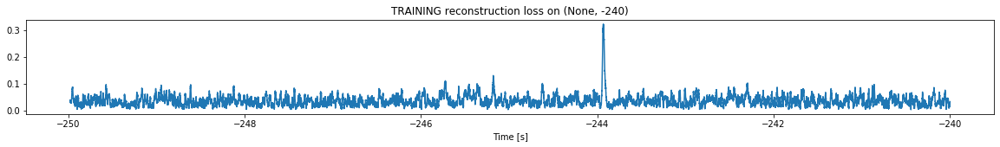

Finished training, median of the log(loss) is:  -1.4767638874262243
<--------
Entering sections:  (-230, -220)
-------->
Training for section:  (-240, -230)


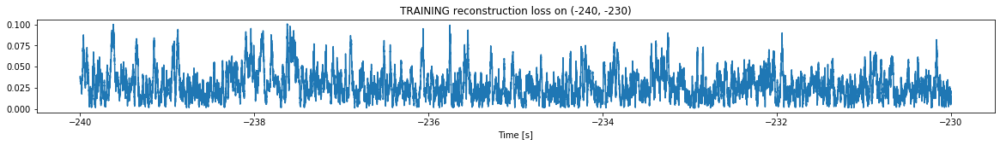

Finished training, median of the log(loss) is:  -1.6059085010562937
Triggering for section:  (-230, -220)
Using this median for triggering: -1.4767638874262243
Triggering threshold is:  3.0


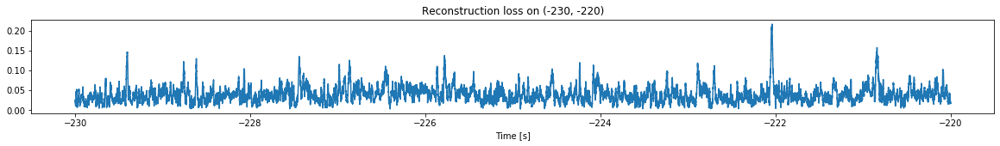

<--------
Entering sections:  (-220, -210)
-------->
Training for section:  (-230, -220)


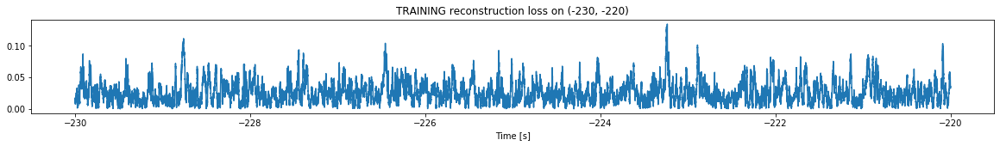

Finished training, median of the log(loss) is:  -1.6332352352908348
Triggering for section:  (-220, -210)
Using this median for triggering: -1.6059085010562937
Triggering threshold is:  2.3


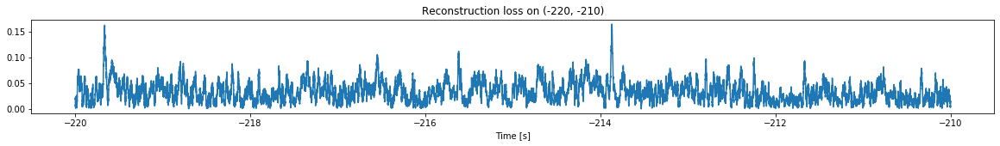

<--------
Entering sections:  (-210, -200)
-------->
Training for section:  (-220, -210)


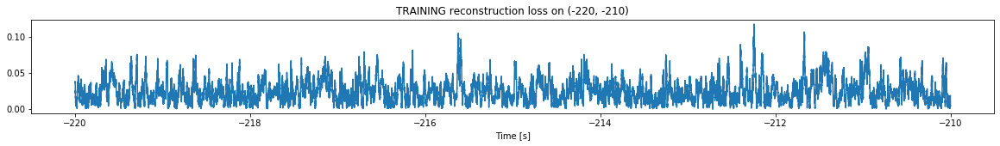

Finished training, median of the log(loss) is:  -1.6555131480902348
Triggering for section:  (-210, -200)
Using this median for triggering: -1.6332352352908348
Triggering threshold is:  1.6


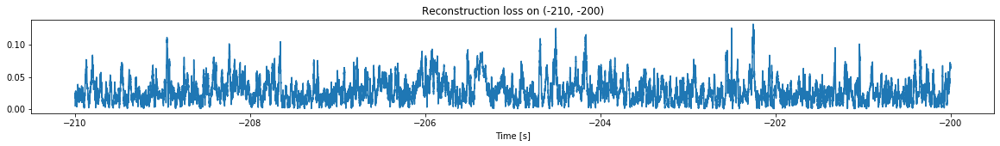

<--------
Entering sections:  (-200, -190)
-------->
Training for section:  (-210, -200)


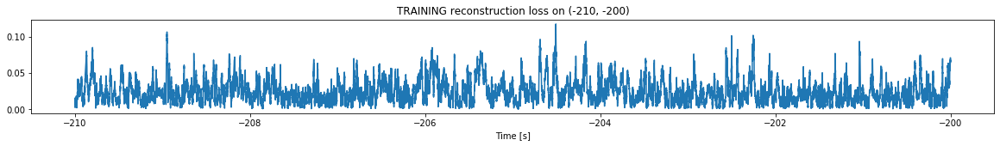

Finished training, median of the log(loss) is:  -1.667264552893847
Triggering for section:  (-200, -190)
Using this median for triggering: -1.6555131480902348
Triggering threshold is:  1.6


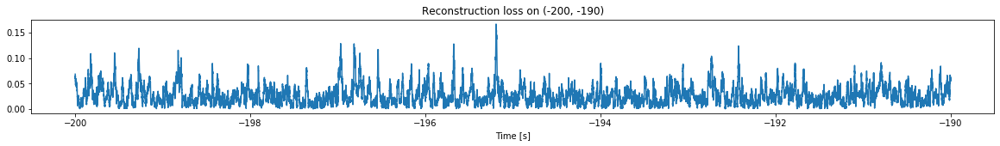

<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


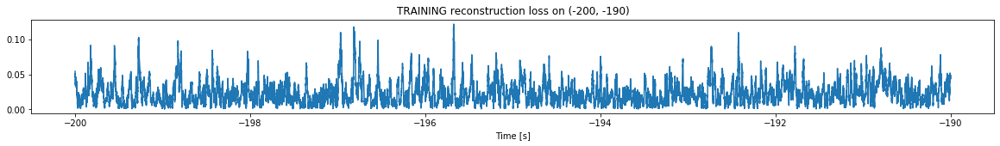

Finished training, median of the log(loss) is:  -1.701725148211873
Triggering for section:  (-190, -180)
Using this median for triggering: -1.667264552893847
Triggering threshold is:  1.6


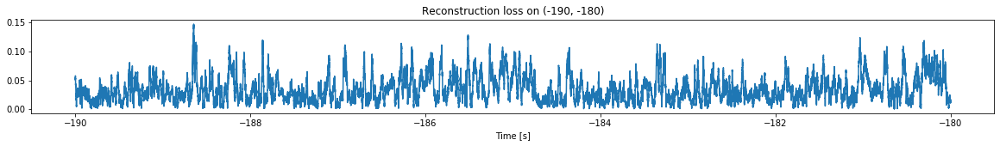

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


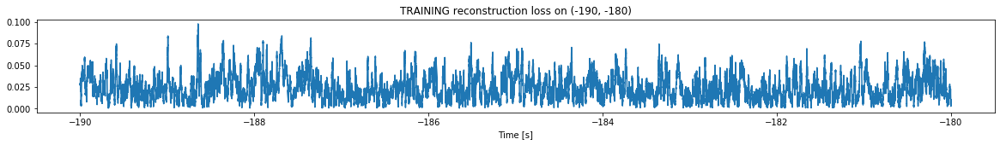

Finished training, median of the log(loss) is:  -1.6739887277280205
Triggering for section:  (-180, -170)
Using this median for triggering: -1.701725148211873
Triggering threshold is:  1.6


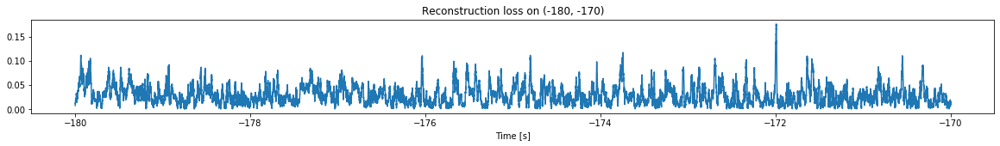

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


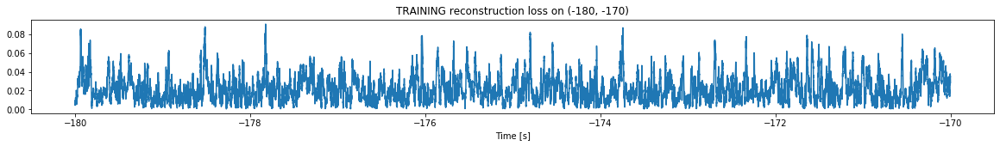

Finished training, median of the log(loss) is:  -1.7211636919534592
Triggering for section:  (-170, -160)
Using this median for triggering: -1.6739887277280205
Triggering threshold is:  1.6


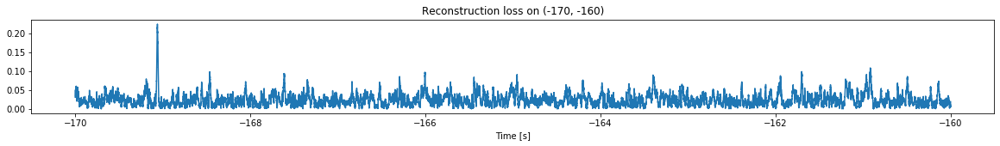

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


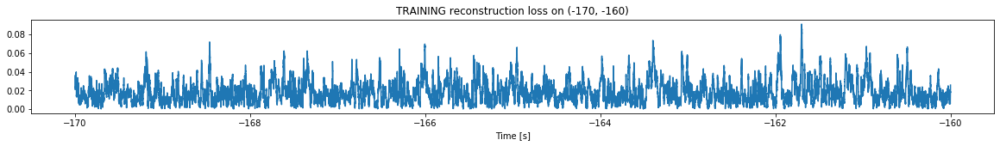

Finished training, median of the log(loss) is:  -1.792190851178502
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7211636919534592
Triggering threshold is:  1.6


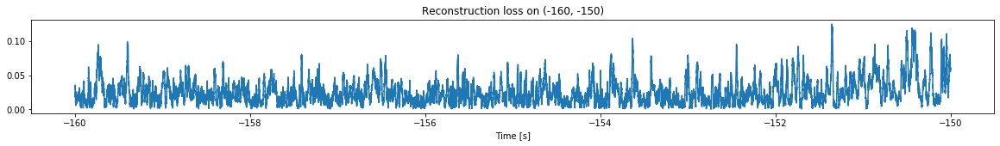

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


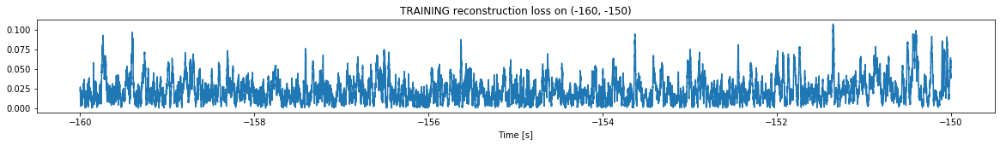

Finished training, median of the log(loss) is:  -1.7052253617496875
Triggering for section:  (-150, -140)
Using this median for triggering: -1.792190851178502
Triggering threshold is:  1.6


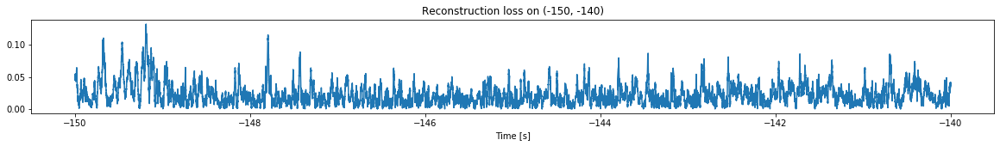

<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


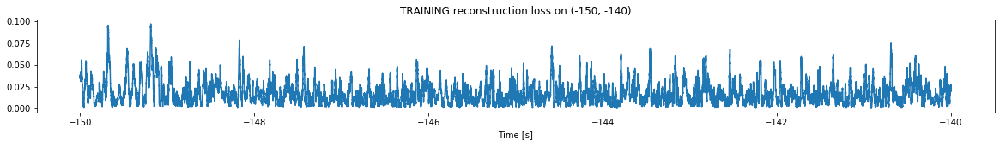

Finished training, median of the log(loss) is:  -1.8332145045418815
Triggering for section:  (-140, -130)
Using this median for triggering: -1.7052253617496875
Triggering threshold is:  1.6


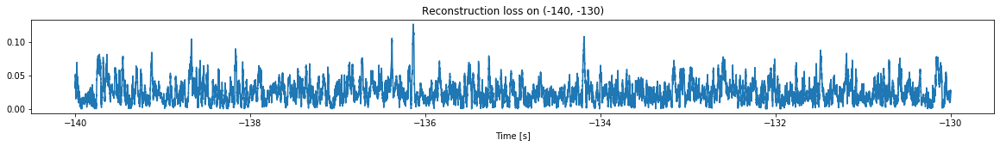

<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


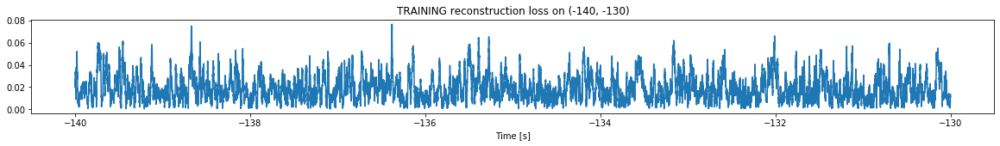

Finished training, median of the log(loss) is:  -1.7793113570920136
Triggering for section:  (-130, -120)
Using this median for triggering: -1.8332145045418815
Triggering threshold is:  1.6


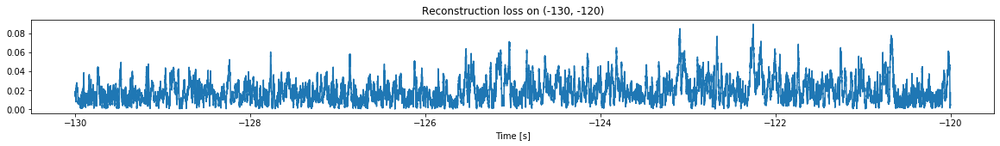

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


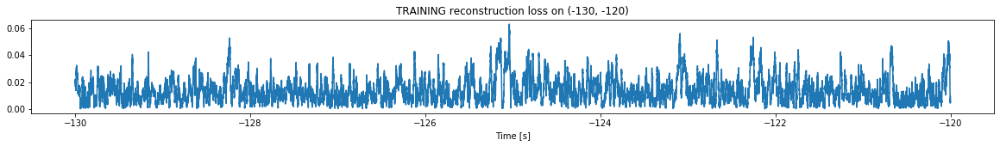

Finished training, median of the log(loss) is:  -1.9197779521622653
Triggering for section:  (-120, -110)
Using this median for triggering: -1.7793113570920136
Triggering threshold is:  1.6


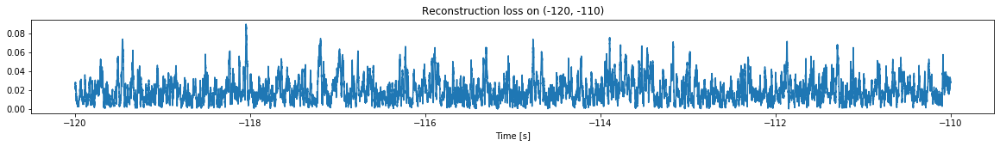

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


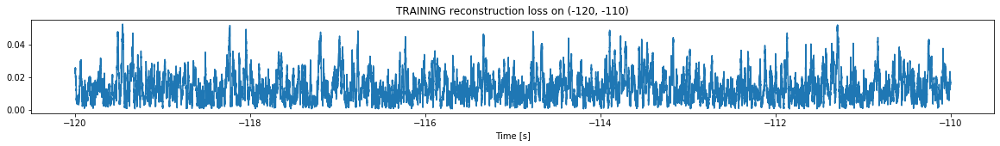

Finished training, median of the log(loss) is:  -1.9122555637203926
Triggering for section:  (-110, -100)
Using this median for triggering: -1.9197779521622653
Triggering threshold is:  1.6


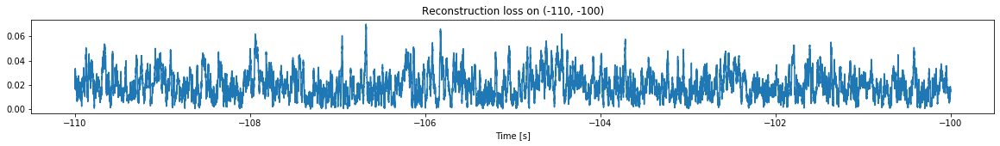

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


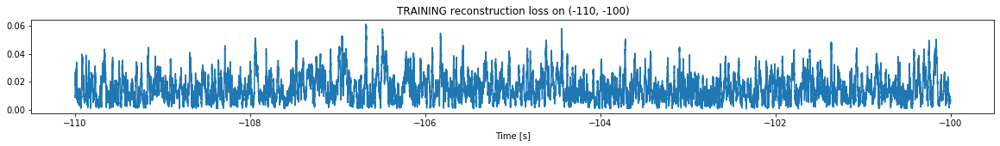

Finished training, median of the log(loss) is:  -1.8618567739207696
Triggering for section:  (-100, -90)
Using this median for triggering: -1.9122555637203926
Triggering threshold is:  1.6


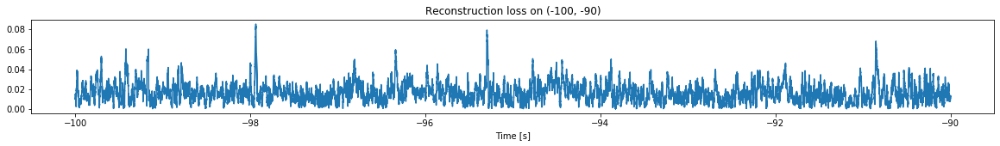

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


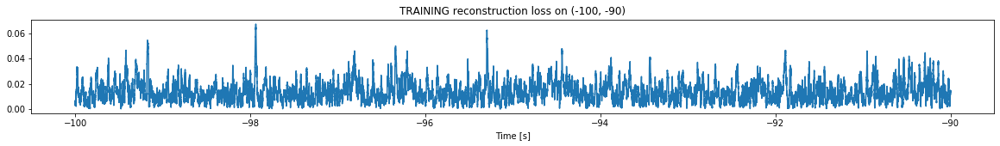

Finished training, median of the log(loss) is:  -1.9064679204003125
Triggering for section:  (-90, -80)
Using this median for triggering: -1.8618567739207696
Triggering threshold is:  1.6


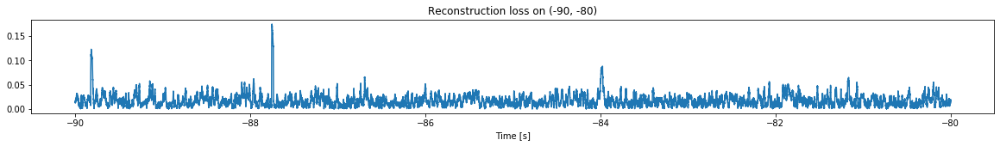

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


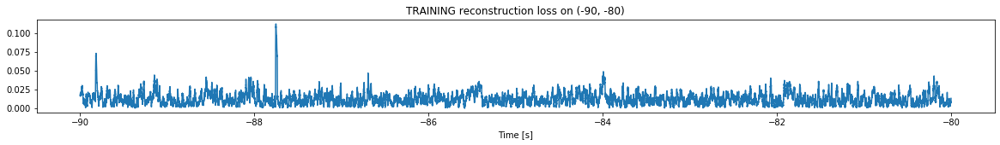

Finished training, median of the log(loss) is:  -1.9357352908608312
Triggering for section:  (-80, -70)
Using this median for triggering: -1.9064679204003125
Triggering threshold is:  1.6


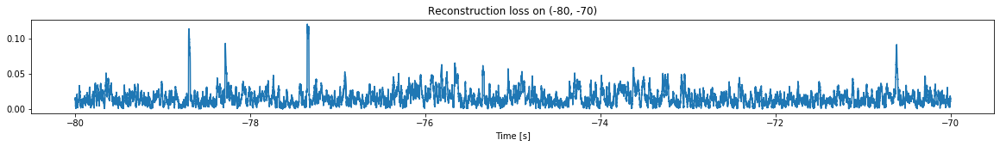

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


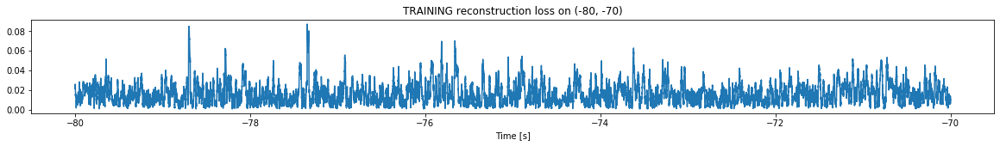

Finished training, median of the log(loss) is:  -1.851508897131465
Triggering for section:  (-70, -60)
Using this median for triggering: -1.9357352908608312
Triggering threshold is:  1.6


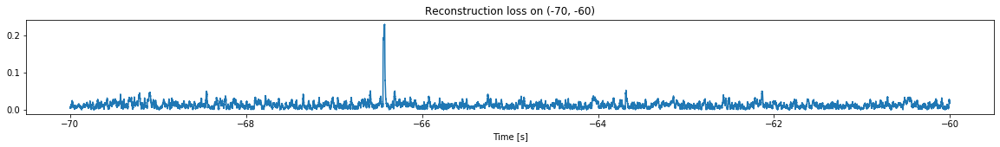

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


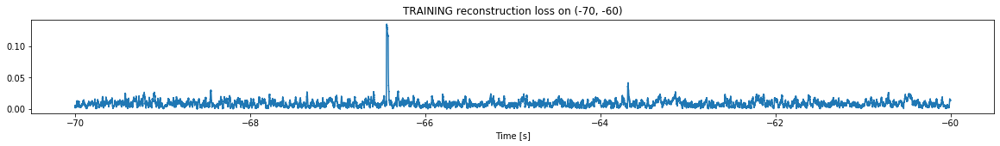

Finished training, median of the log(loss) is:  -2.0874040206788296
Triggering for section:  (-60, -50)
Using this median for triggering: -1.851508897131465
Triggering threshold is:  1.6


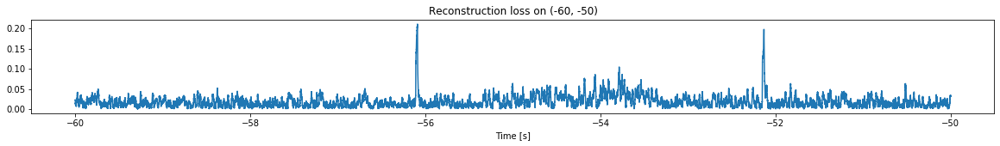

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


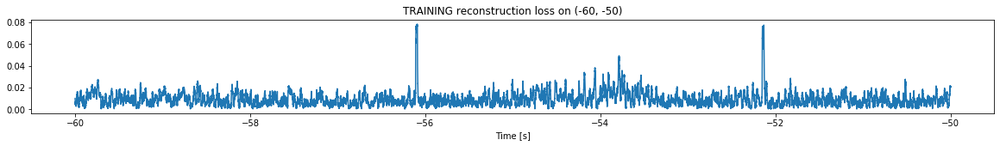

Finished training, median of the log(loss) is:  -2.075564786275824
Triggering for section:  (-50, -40)
Using this median for triggering: -2.0874040206788296
Triggering threshold is:  1.6


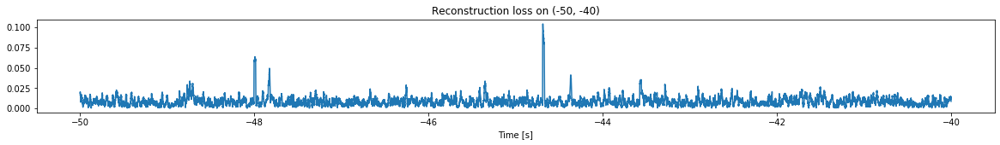

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


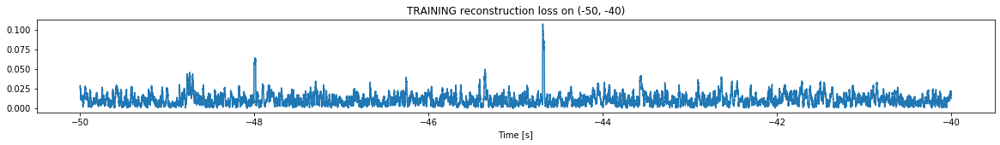

Finished training, median of the log(loss) is:  -2.000202680863935
Triggering for section:  (-40, -30)
Using this median for triggering: -2.075564786275824
Triggering threshold is:  1.6


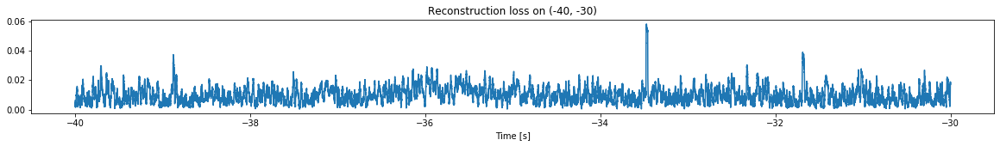

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


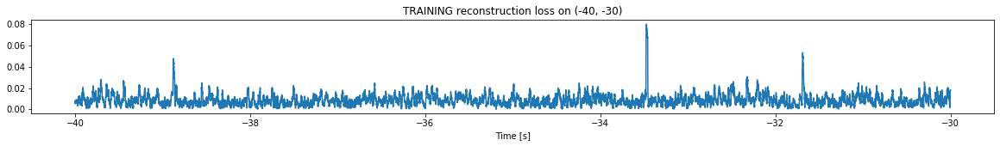

Finished training, median of the log(loss) is:  -2.1034244075809077
Triggering for section:  (-30, -20)
Using this median for triggering: -2.000202680863935
Triggering threshold is:  1.6


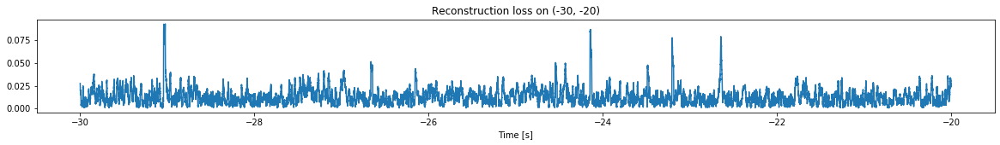

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


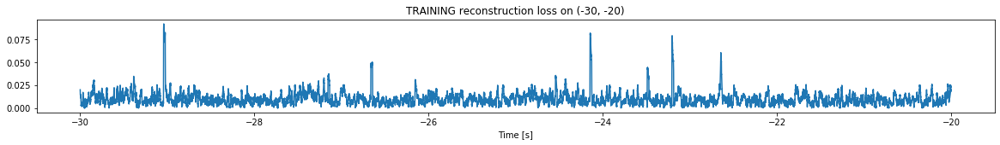

Finished training, median of the log(loss) is:  -2.0347250654849534
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1034244075809077
Triggering threshold is:  1.6


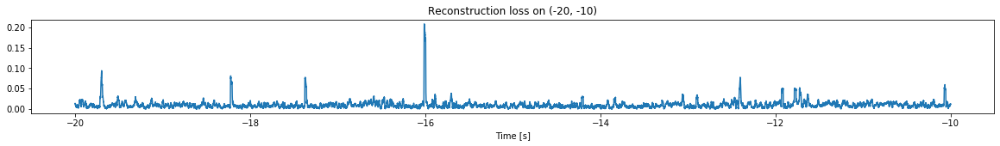

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


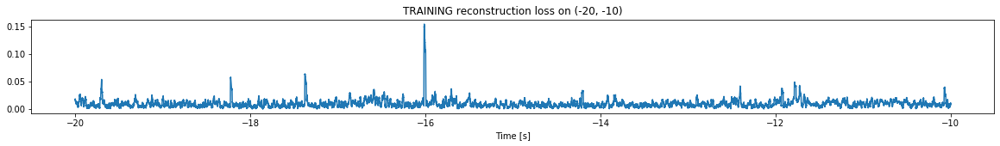

Finished training, median of the log(loss) is:  -2.072658236563562
Triggering for section:  (-10, 0)
Using this median for triggering: -2.0347250654849534
Triggering threshold is:  1.6


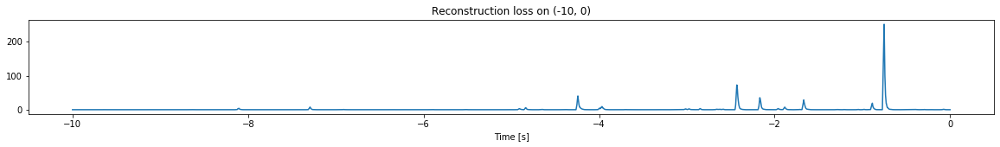

Other trigger time:  [-8.10439   -7.29349   -5.9109898 -4.83739   -4.24249   -3.6989899
 -3.0147898 -2.43099   -1.6677899 -0.75219   -0.07489  ]
Their log loss values are:  [2.64795275 2.92823431 1.77106179 2.8096608  3.63893876 1.78755948
 2.46148588 3.89657618 3.4957735  4.43518955 2.13134376]


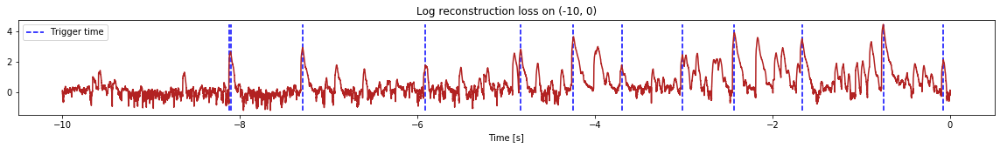

Triggered at:  [-8.10439, -7.29349, -5.9109898, -4.83739, -4.24249, -3.6989899, -3.0147898, -2.43099, -1.6677899, -0.75219, -0.074889995]
Latent coordinates are:  [[41.596676, 1.3634418], [66.11066, -0.2376377], [12.877752, 2.2478852], [56.682064, 0.9678062], [236.22748, -1.0], [13.420911, 3.0246747], [32.387035, 3.1062007], [412.52374, -1.0], [180.4221, -1.0], [1214.3064, -1.0], [20.103863, 1.5432967]]
<--------
Normal latent's shape:  (99989, 2)


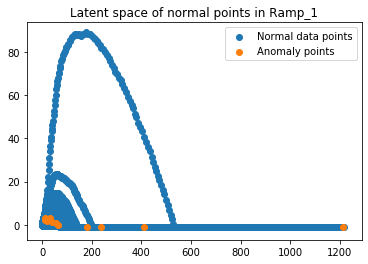

Finished simulation, all the triggered times are:  [-8.10439, -7.29349, -5.9109898, -4.83739, -4.24249, -3.6989899, -3.0147898, -2.43099, -1.6677899, -0.75219, -0.074889995]

All latent coordinate:  [[41.596676, 1.3634418], [66.11066, -0.2376377], [12.877752, 2.2478852], [56.682064, 0.9678062], [236.22748, -1.0], [13.420911, 3.0246747], [32.387035, 3.1062007], [412.52374, -1.0], [180.4221, -1.0], [1214.3064, -1.0], [20.103863, 1.5432967]]


In [35]:
simulation("Ramp_1", "15T_data", 10,  time_range = (-250,0), reached_max = -200)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (599800, 6)
Flushing input history
Number of sections: 6
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


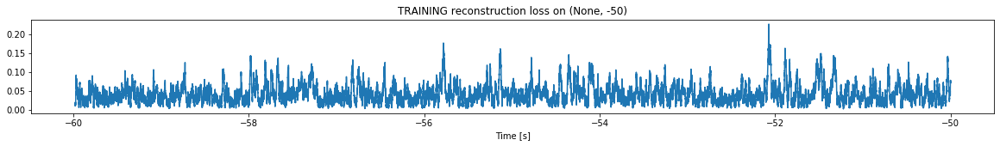

Finished training, median of the log(loss) is:  -1.4164909391293559
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


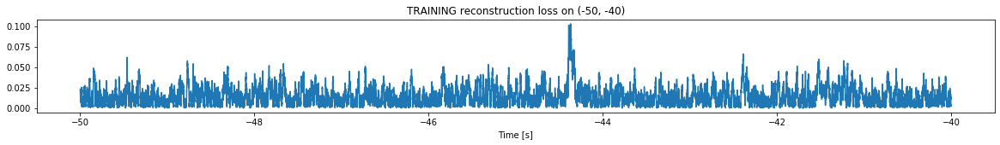

Finished training, median of the log(loss) is:  -1.9196855558349137
Triggering for section:  (-40, -30)
Using this median for triggering: -1.4164909391293559
Triggering threshold is:  3.0


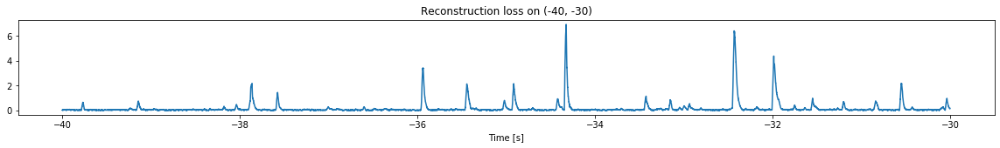

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


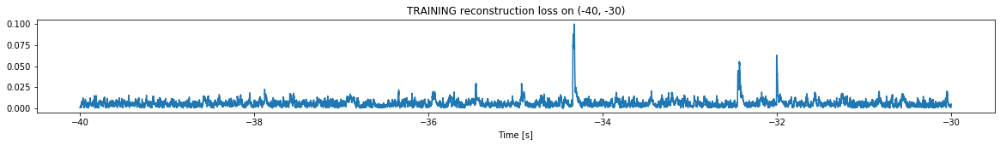

Finished training, median of the log(loss) is:  -2.280074438099603
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9196855558349137
Triggering threshold is:  1.6


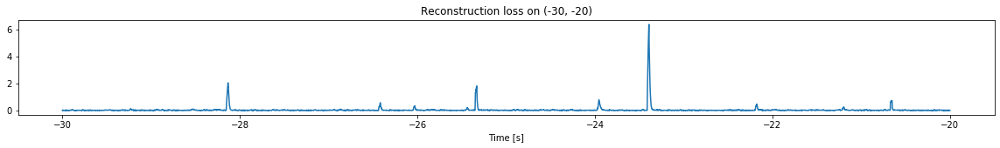

Other trigger time:  [-28.1337   -26.418499 -25.3307   -23.9552   -23.3918   -20.6531  ]
Their log loss values are:  [2.23312949 1.67912131 2.18007513 1.81757957 2.72569603 1.78590769]


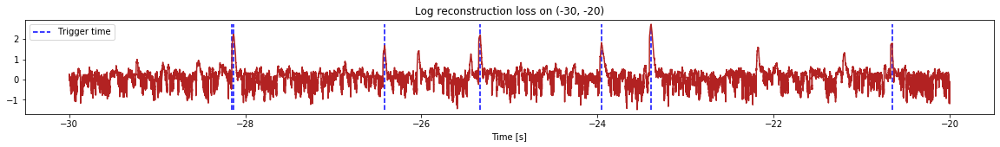

Triggered at:  [-28.1337, -26.418499, -25.3307, -23.9552, -23.3918, -20.6531]
Latent coordinates are:  [[5.658733, -0.88251895], [2.4974432, -0.16827887], [4.012901, -0.8821862], [2.7855842, 0.46736044], [14.036595, -0.9887794], [2.4299452, -0.49673396]]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


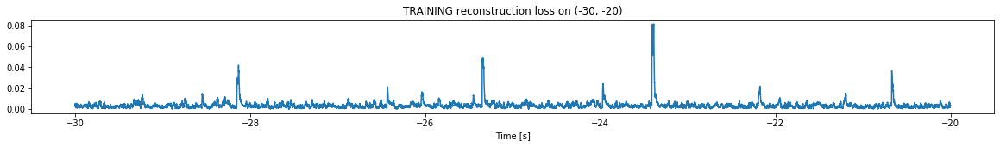

Finished training, median of the log(loss) is:  -2.522158519356172
Triggering for section:  (-20, -10)
Using this median for triggering: -2.280074438099603
Triggering threshold is:  1.6


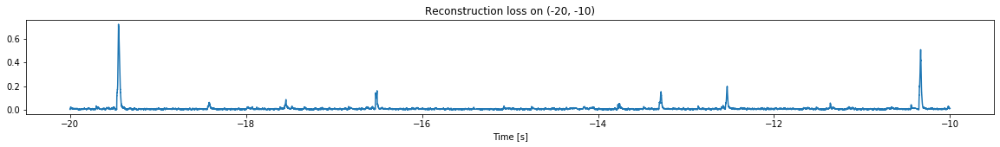

Other trigger time:  [-19.4495 -10.3334]
Their log loss values are:  [2.14063265 1.98745245]


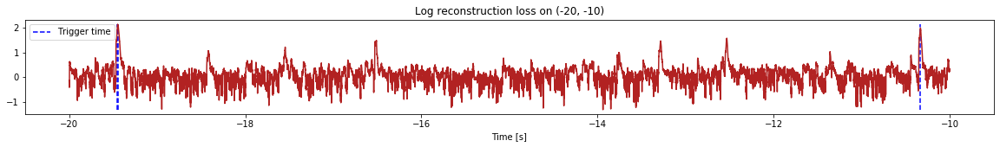

Triggered at:  [-19.4495, -10.3334]
Latent coordinates are:  [[2.0942996, 0.6087713], [1.7742304, -0.10492784]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


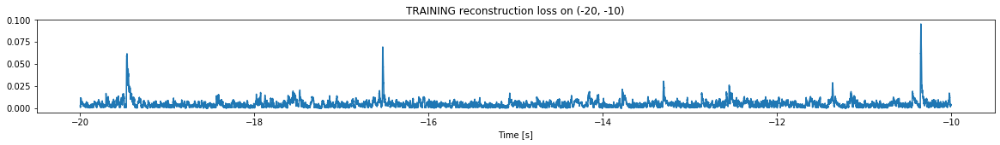

Finished training, median of the log(loss) is:  -2.403343516501875
Triggering for section:  (-10, 0)
Using this median for triggering: -2.522158519356172
Triggering threshold is:  1.6


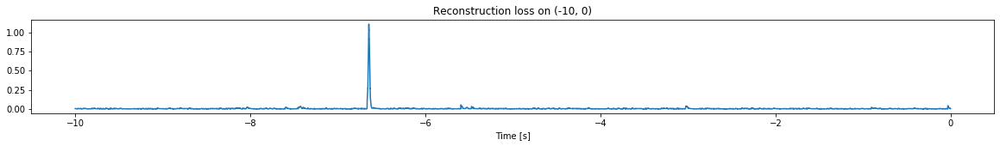

Other trigger time:  [-6.6459]
Their log loss values are:  [2.56652444]


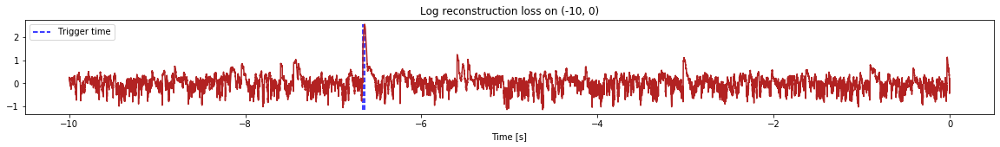

Triggered at:  [-6.6459]
Latent coordinates are:  [[3.6454458, -0.9327201]]
<--------
Normal latent's shape:  (99998, 2)


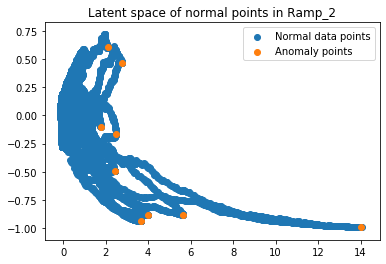

Finished simulation, all the triggered times are:  [-28.1337, -26.418499, -25.3307, -23.9552, -23.3918, -20.6531, -19.4495, -10.3334, -6.6459]

All latent coordinate:  [[5.658733, -0.88251895], [2.4974432, -0.16827887], [4.012901, -0.8821862], [2.7855842, 0.46736044], [14.036595, -0.9887794], [2.4299452, -0.49673396], [2.0942996, 0.6087713], [1.7742304, -0.10492784], [3.6454458, -0.9327201]]


In [33]:
simulation("Ramp_2", "15T_data", 10,  time_range = (-60,0), reached_max = -19.7)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (599800, 6)
Flushing input history
Number of sections: 6
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


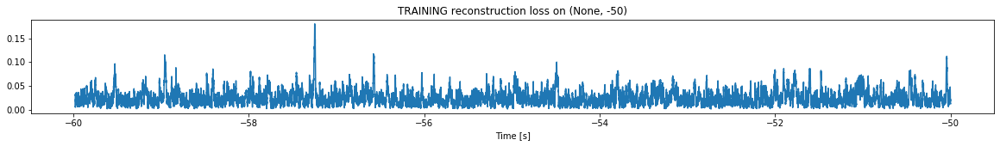

Finished training, median of the log(loss) is:  -1.6709748595120806
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


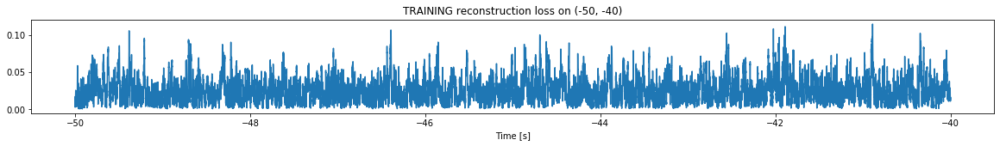

Finished training, median of the log(loss) is:  -1.6440450946949383
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6709748595120806
Triggering threshold is:  3.0


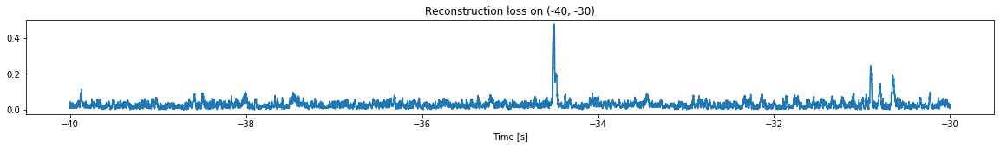

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


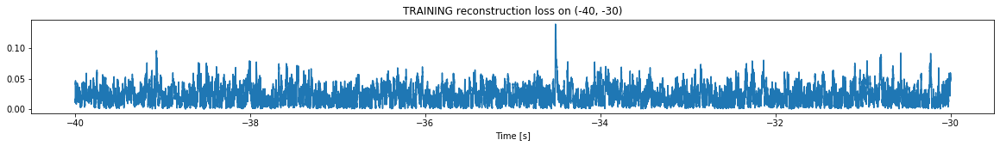

Finished training, median of the log(loss) is:  -1.7050577429813507
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6440450946949383
Triggering threshold is:  1.6


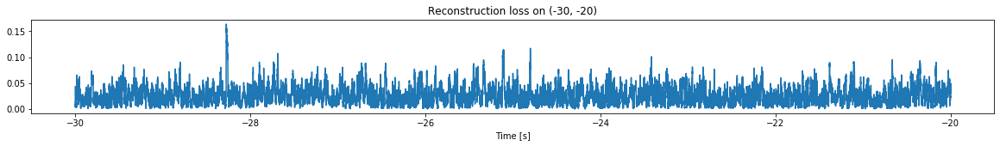

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


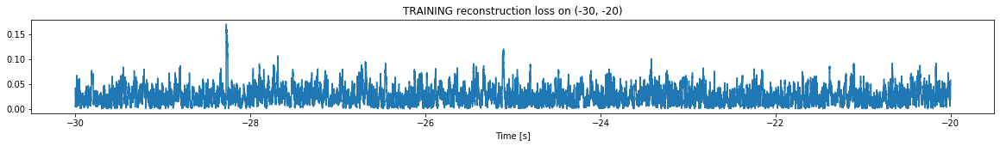

Finished training, median of the log(loss) is:  -1.6303836271623608
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7050577429813507
Triggering threshold is:  1.6


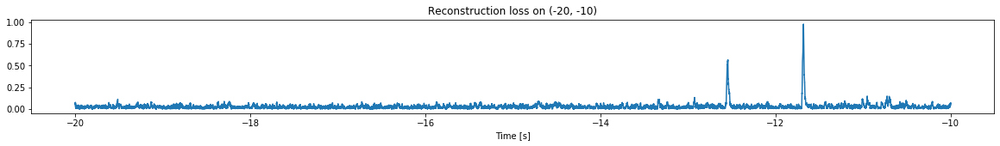

Other trigger time:  [-11.6804]
Their log loss values are:  [1.69657158]


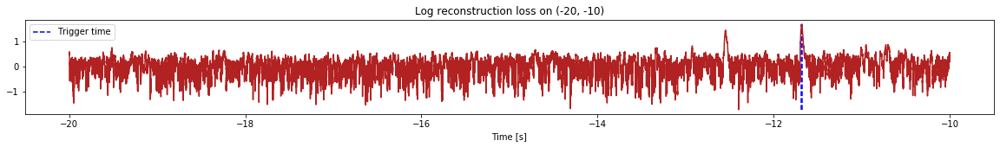

Triggered at:  [-11.6804]
Latent coordinates are:  [[-0.72788084, -0.7543695]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


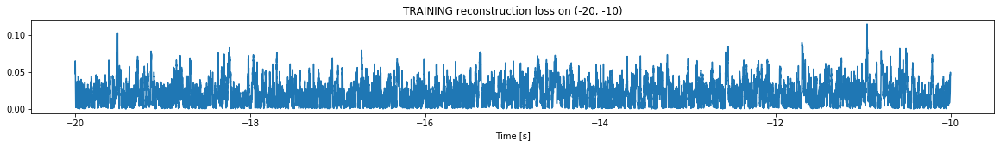

Finished training, median of the log(loss) is:  -1.73843734515932
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6303836271623608
Triggering threshold is:  1.6


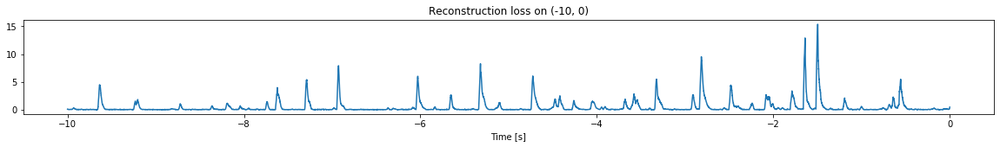

Other trigger time:  [-9.6373    -8.7233    -8.1886    -7.6225996 -6.9284    -6.0297
 -5.3197    -4.7263    -4.0516    -3.326     -2.8156    -2.0804
 -1.4969    -0.5555   ]
Their log loss values are:  [2.28184035 1.65416557 1.69285242 2.22989452 2.52904742 2.4096199
 2.54777721 2.41317707 1.80658636 2.36905203 2.60925918 2.05040149
 2.81706479 2.36834937]


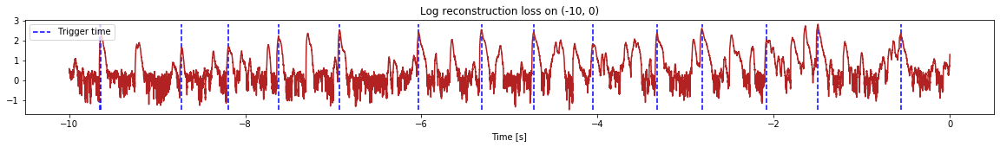

Triggered at:  [-9.6373, -8.7233, -8.1886, -7.6225996, -6.9284, -6.0297, -5.3197, -4.7263, -4.0516, -3.326, -2.8156, -2.0804, -1.4969, -0.5555]
Latent coordinates are:  [[-0.9232563, -0.97667545], [-0.7725776, -0.7382729], [-0.77853554, -0.76310146], [-0.8772622, -0.99211204], [-0.9550069, -0.9993489], [-0.9395215, -0.9963897], [-0.9687028, -0.998887], [-0.94656736, -0.9913476], [-0.81153864, -0.79274195], [-0.9219167, -0.9945345], [-0.9766115, -0.99945146], [-0.8830249, -0.91409755], [-0.9863378, -0.99999994], [-0.9282246, -0.9948615]]
<--------
Normal latent's shape:  (99985, 2)


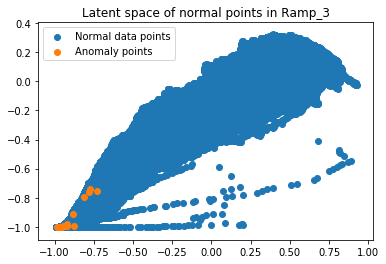

Finished simulation, all the triggered times are:  [-11.6804, -9.6373, -8.7233, -8.1886, -7.6225996, -6.9284, -6.0297, -5.3197, -4.7263, -4.0516, -3.326, -2.8156, -2.0804, -1.4969, -0.5555]

All latent coordinate:  [[-0.72788084, -0.7543695], [-0.9232563, -0.97667545], [-0.7725776, -0.7382729], [-0.77853554, -0.76310146], [-0.8772622, -0.99211204], [-0.9550069, -0.9993489], [-0.9395215, -0.9963897], [-0.9687028, -0.998887], [-0.94656736, -0.9913476], [-0.81153864, -0.79274195], [-0.9219167, -0.9945345], [-0.9766115, -0.99945146], [-0.8830249, -0.91409755], [-0.9863378, -0.99999994], [-0.9282246, -0.9948615]]


In [34]:
simulation("Ramp_3", "15T_data", 10,  time_range = (-60,0), reached_max = -17)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


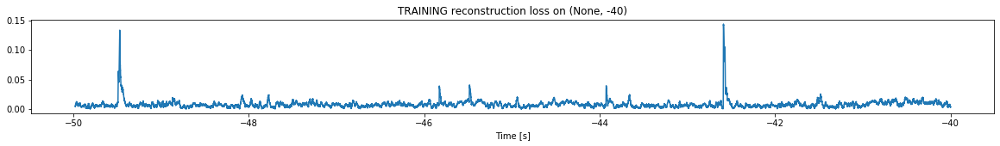

Finished training, median of the log(loss) is:  -2.151158453556238
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


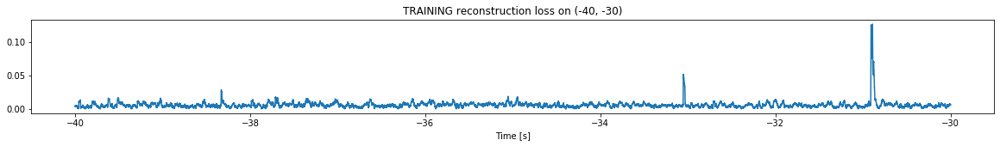

Finished training, median of the log(loss) is:  -2.2558853482568066
Triggering for section:  (-30, -20)
Using this median for triggering: -2.151158453556238
Triggering threshold is:  3.0


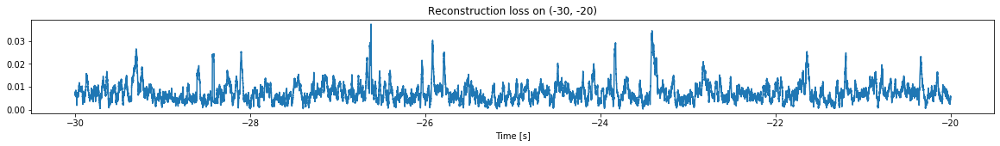

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


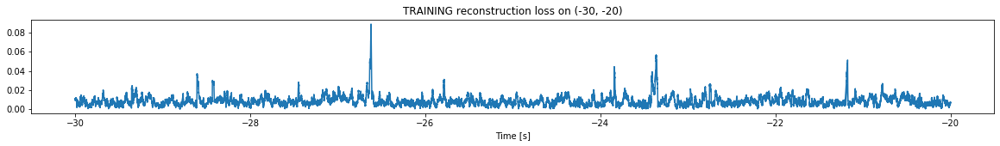

Finished training, median of the log(loss) is:  -2.1142115097632512
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2558853482568066
Triggering threshold is:  1.6


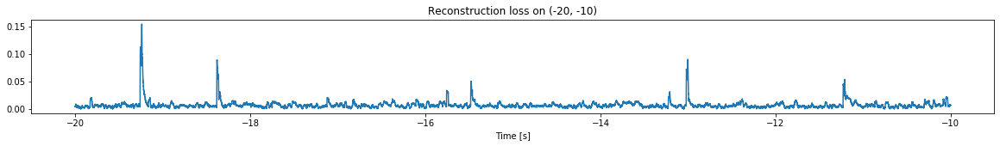

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


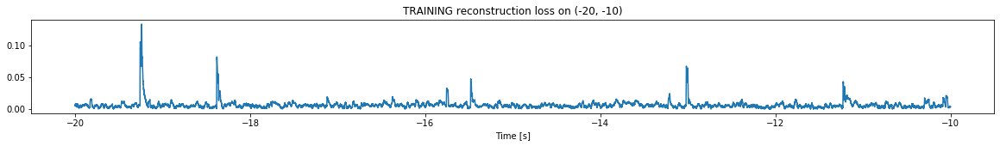

Finished training, median of the log(loss) is:  -2.2674456677403962
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1142115097632512
Triggering threshold is:  1.6


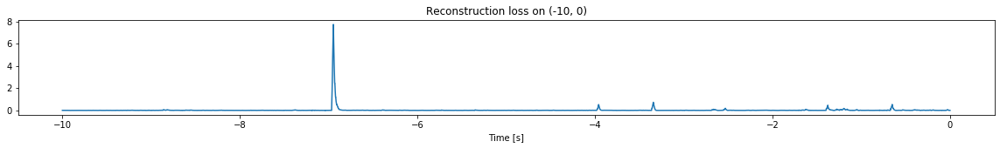

Other trigger time:  [-6.947     -3.9587998 -3.3423    -1.3766999 -0.6513   ]
Their log loss values are:  [3.00336616 1.83757134 1.98021557 1.78896957 1.84834623]


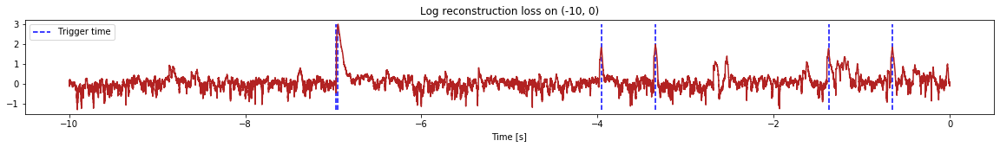

Triggered at:  [-6.947, -3.9587998, -3.3423, -1.3766999, -0.6513]
Latent coordinates are:  [[12.405189, 35.453735], [1.7666978, 7.0582466], [2.118018, 8.432995], [1.2926661, 7.2836776], [2.7331567, 7.1053696]]
<--------
Normal latent's shape:  (99994, 2)


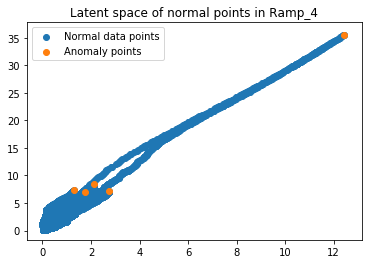

Finished simulation, all the triggered times are:  [-6.947, -3.9587998, -3.3423, -1.3766999, -0.6513]

All latent coordinate:  [[12.405189, 35.453735], [1.7666978, 7.0582466], [2.118018, 8.432995], [1.2926661, 7.2836776], [2.7331567, 7.1053696]]


In [36]:
simulation("Ramp_4", "15T_data", 10,  time_range = (-50,0), reached_max = -6.3)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


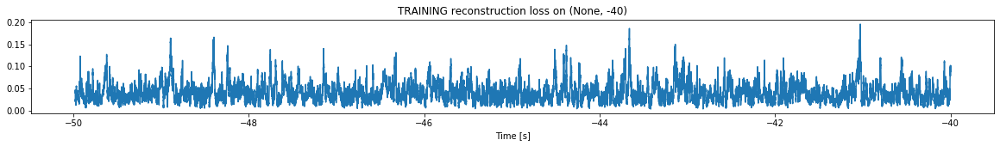

Finished training, median of the log(loss) is:  -1.4443881341539806
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


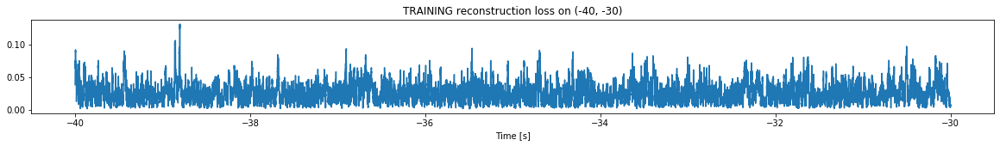

Finished training, median of the log(loss) is:  -1.6396883127857547
Triggering for section:  (-30, -20)
Using this median for triggering: -1.4443881341539806
Triggering threshold is:  3.0


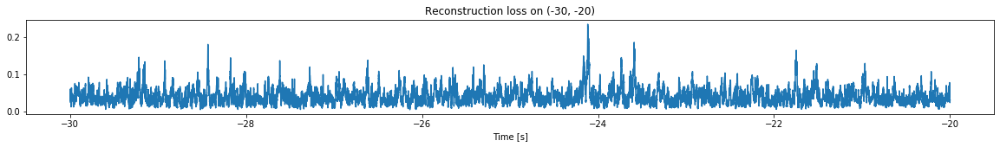

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


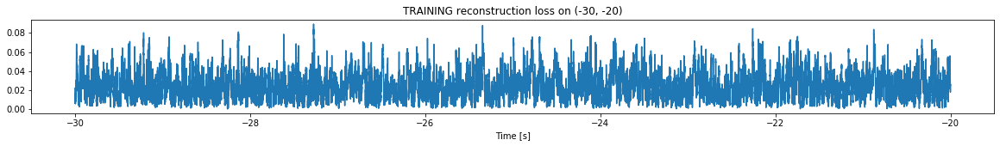

Finished training, median of the log(loss) is:  -1.6518613772524577
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6396883127857547
Triggering threshold is:  1.6


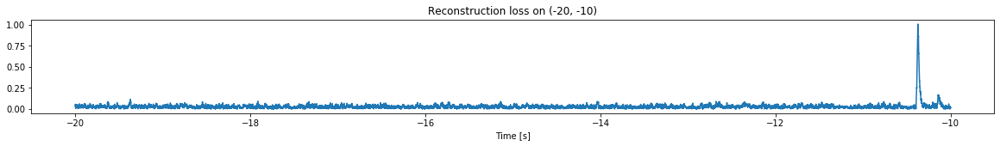

Other trigger time:  [-10.373]
Their log loss values are:  [1.64349317]


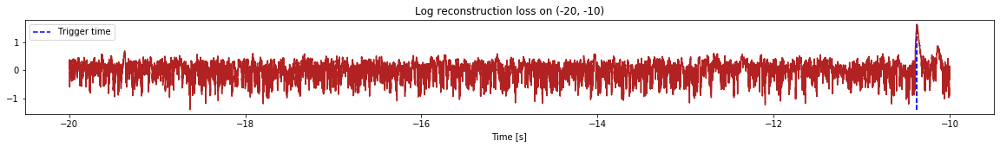

Triggered at:  [-10.373]
Latent coordinates are:  [[-0.7276865, 2.212952]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


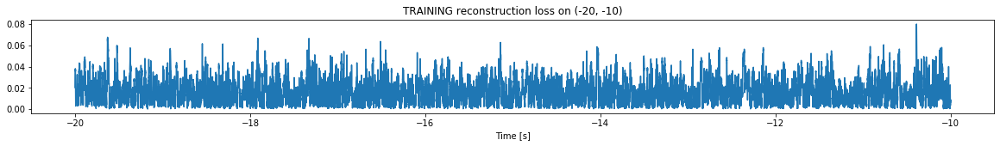

Finished training, median of the log(loss) is:  -1.832807011570575
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6518613772524577
Triggering threshold is:  1.6


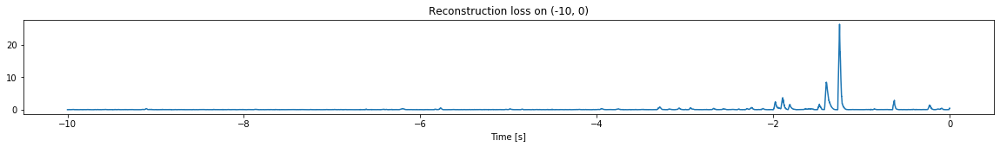

Other trigger time:  [-1.8928     -1.2480999  -0.62659997]
Their log loss values are:  [2.21463018 3.07338796 2.11583212]


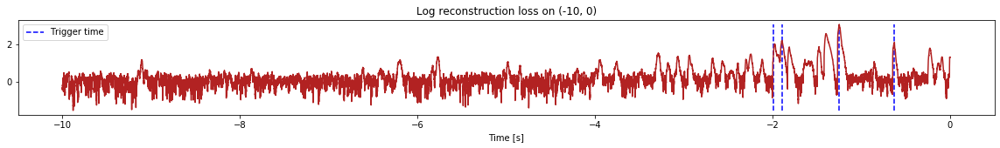

Triggered at:  [-1.8928, -1.2480999, -0.62659997]
Latent coordinates are:  [[-0.9855678, 4.501985], [-1.0, 11.205716], [-0.9759957, 4.386694]]
<--------
Normal latent's shape:  (99996, 2)


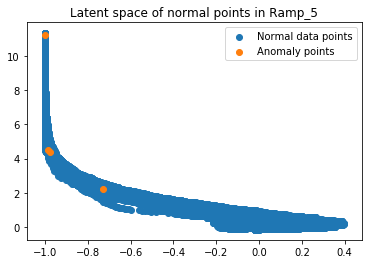

Finished simulation, all the triggered times are:  [-10.373, -1.8928, -1.2480999, -0.62659997]

All latent coordinate:  [[-0.7276865, 2.212952], [-0.9855678, 4.501985], [-1.0, 11.205716], [-0.9759957, 4.386694]]


In [37]:
simulation("Ramp_5", "15T_data", 10,  time_range = (-50,0), reached_max = -2.55)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


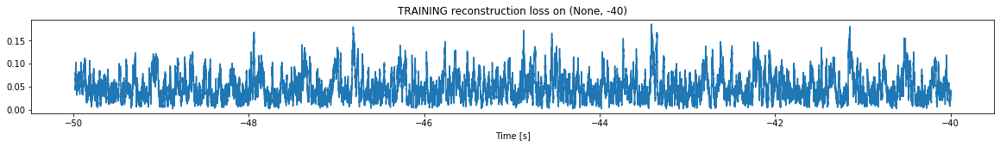

Finished training, median of the log(loss) is:  -1.3701312979467823
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


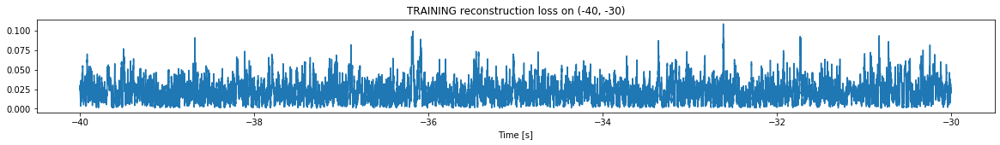

Finished training, median of the log(loss) is:  -1.7035601649557082
Triggering for section:  (-30, -20)
Using this median for triggering: -1.3701312979467823
Triggering threshold is:  3.0


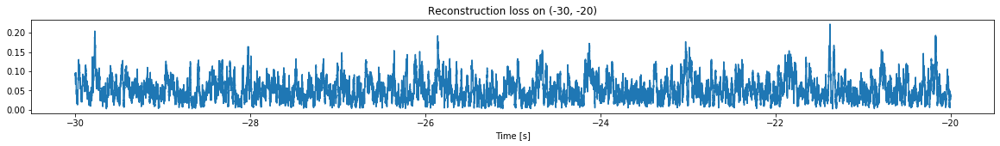

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


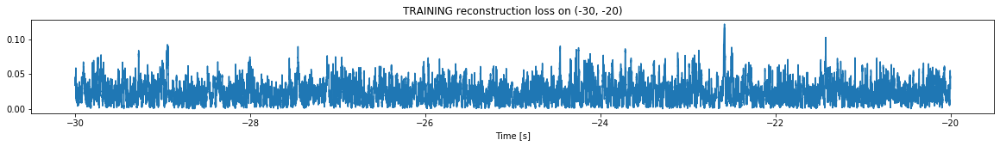

Finished training, median of the log(loss) is:  -1.6581368254579645
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7035601649557082
Triggering threshold is:  1.6


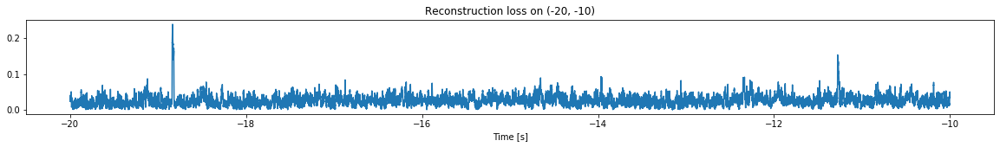

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


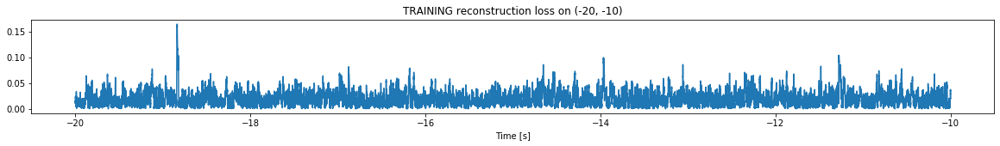

Finished training, median of the log(loss) is:  -1.7475763495698367
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6581368254579645
Triggering threshold is:  1.6


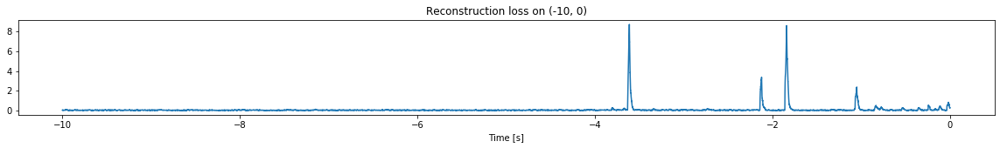

Other trigger time:  [-3.6125998 -1.8406999 -1.05     ]
Their log loss values are:  [2.59952615 2.59326155 2.03432933]


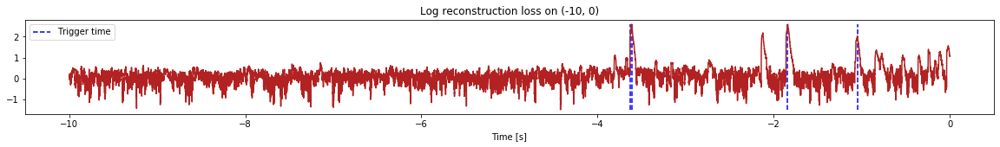

Triggered at:  [-3.6125998, -1.8406999, -1.05]
Latent coordinates are:  [[36.59386, 7.5632095], [31.387323, 8.958148], [18.829416, 2.1152608]]
<--------
Normal latent's shape:  (99996, 2)


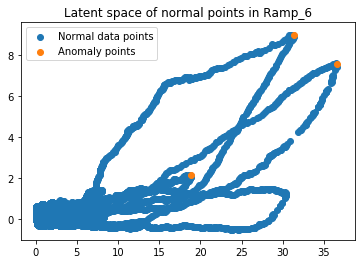

Finished simulation, all the triggered times are:  [-3.6125998, -1.8406999, -1.05]

All latent coordinate:  [[36.59386, 7.5632095], [31.387323, 8.958148], [18.829416, 2.1152608]]


In [38]:
simulation("Ramp_6", "15T_data", 10,  time_range = (-50,0), reached_max = -2.8)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


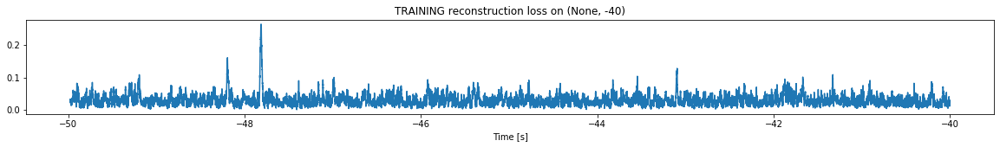

Finished training, median of the log(loss) is:  -1.5742516314343291
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


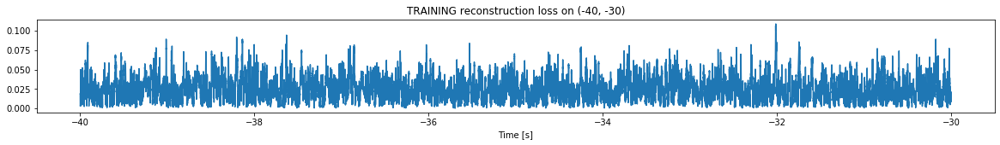

Finished training, median of the log(loss) is:  -1.6389065695539857
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5742516314343291
Triggering threshold is:  3.0


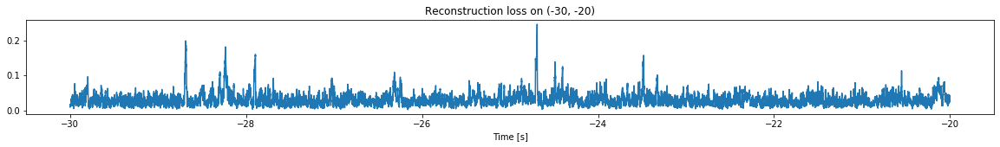

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


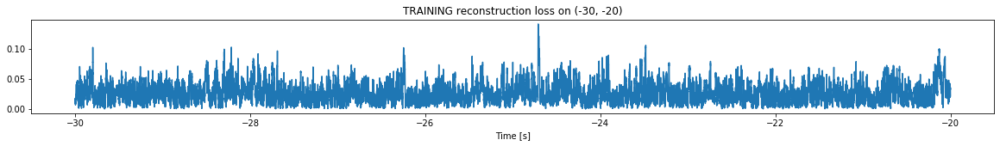

Finished training, median of the log(loss) is:  -1.6280211527430057
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6389065695539857
Triggering threshold is:  1.6


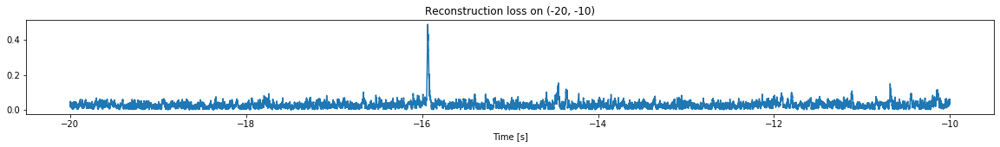

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


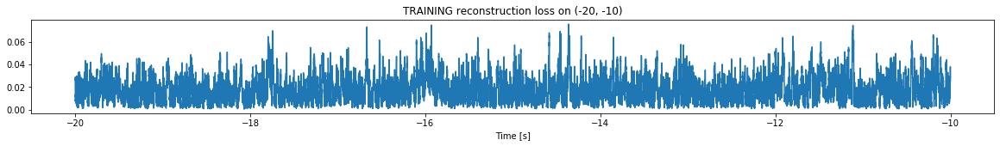

Finished training, median of the log(loss) is:  -1.7920014612182296
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6280211527430057
Triggering threshold is:  1.6


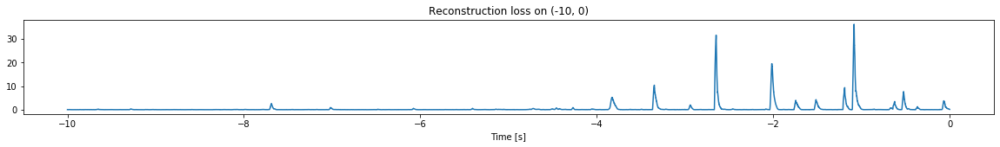

Other trigger time:  [-7.6867     -3.8476999  -3.3476     -2.6469998  -2.0161     -1.0834
 -0.52169997]
Their log loss values are:  [2.02814367 1.81971056 2.64600667 3.12902002 2.91938771 3.18850613
 2.51480921]


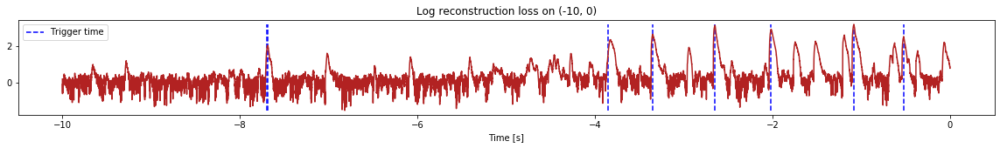

Triggered at:  [-7.6867, -3.8476999, -3.3476, -2.6469998, -2.0161, -1.0834, -0.52169997]
Latent coordinates are:  [[-0.9471684, 1.2823316], [-0.8815716, 0.9404986], [-0.99988043, 0.011982473], [-1.0, -0.9854555], [-0.9999999, -0.876407], [-1.0, -0.9999942], [-0.99945325, 0.40849224]]
<--------
Normal latent's shape:  (99992, 2)


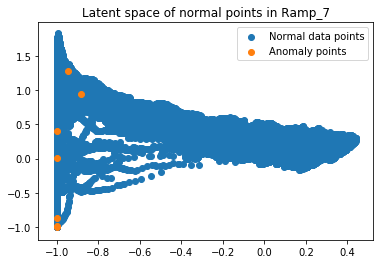

Finished simulation, all the triggered times are:  [-7.6867, -3.8476999, -3.3476, -2.6469998, -2.0161, -1.0834, -0.52169997]

All latent coordinate:  [[-0.9471684, 1.2823316], [-0.8815716, 0.9404986], [-0.99988043, 0.011982473], [-1.0, -0.9854555], [-0.9999999, -0.876407], [-1.0, -0.9999942], [-0.99945325, 0.40849224]]


In [39]:
simulation("Ramp_7", "15T_data", 10,  time_range = (-50,0), reached_max = -6.15)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


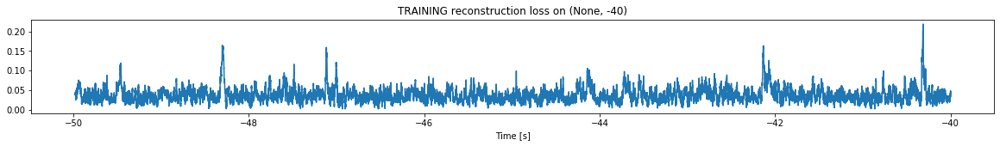

Finished training, median of the log(loss) is:  -1.4597861509389496
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


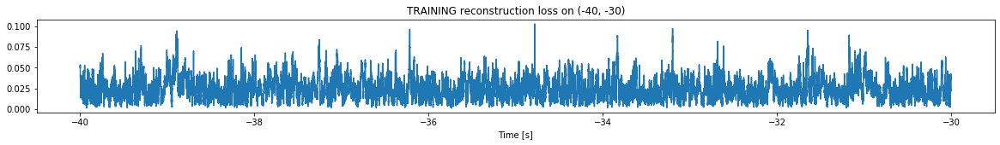

Finished training, median of the log(loss) is:  -1.6570715087168302
Triggering for section:  (-30, -20)
Using this median for triggering: -1.4597861509389496
Triggering threshold is:  3.0


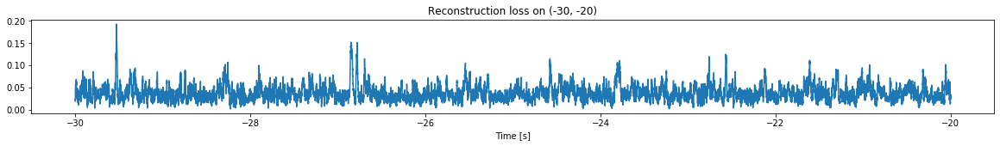

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


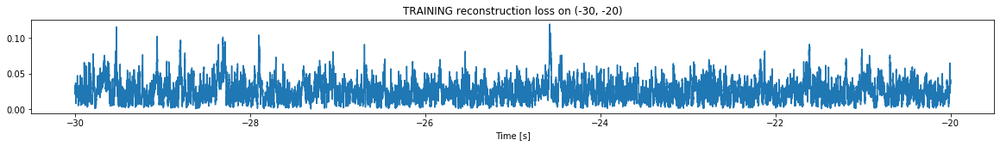

Finished training, median of the log(loss) is:  -1.6345196720855002
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6570715087168302
Triggering threshold is:  1.6


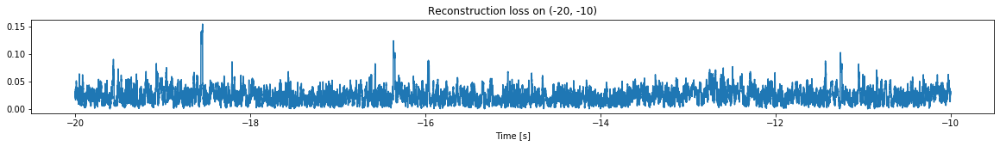

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


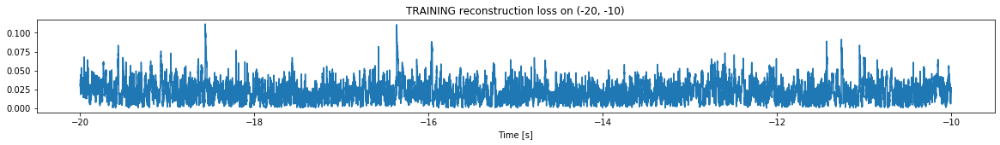

Finished training, median of the log(loss) is:  -1.6969707725202352
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6345196720855002
Triggering threshold is:  1.6


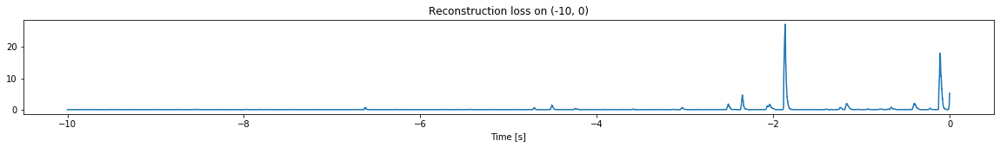

Other trigger time:  [-4.5085998 -2.5094    -1.8632    -1.1694    -0.1069   ]
Their log loss values are:  [1.80645157 1.8976127  3.06925626 1.93210762 2.89085007]


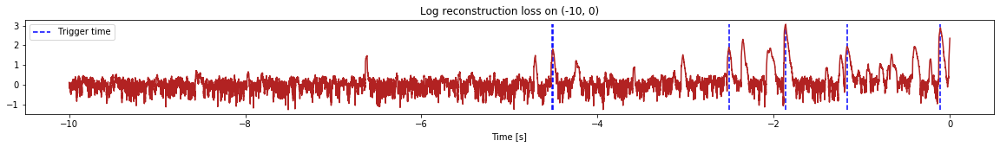

Triggered at:  [-4.5085998, -2.5094, -1.8632, -1.1694, -0.1069]
Latent coordinates are:  [[-0.6739466, 0.9680485], [-0.6930258, 1.1306412], [-0.826859, 1.5568376], [-0.71604156, 0.69838285], [-0.826731, 1.555545]]
<--------
Normal latent's shape:  (99994, 2)


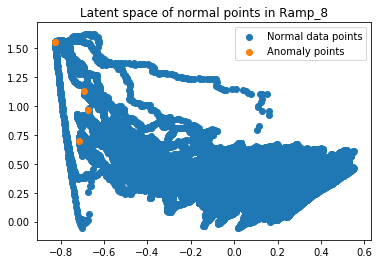

Finished simulation, all the triggered times are:  [-4.5085998, -2.5094, -1.8632, -1.1694, -0.1069]

All latent coordinate:  [[-0.6739466, 0.9680485], [-0.6930258, 1.1306412], [-0.826859, 1.5568376], [-0.71604156, 0.69838285], [-0.826731, 1.555545]]


In [40]:
simulation("Ramp_8", "15T_data", 10,  time_range = (-50,0), reached_max = -2.2)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


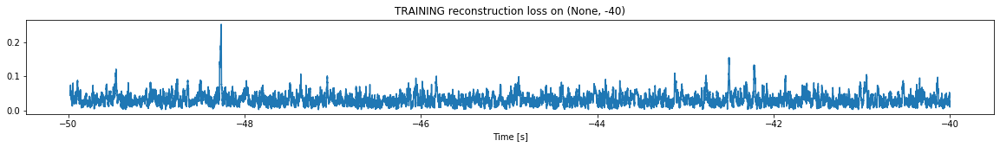

Finished training, median of the log(loss) is:  -1.5344547734579
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


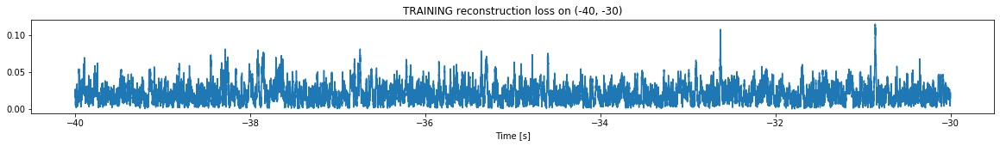

Finished training, median of the log(loss) is:  -1.7327212933871263
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5344547734579
Triggering threshold is:  3.0


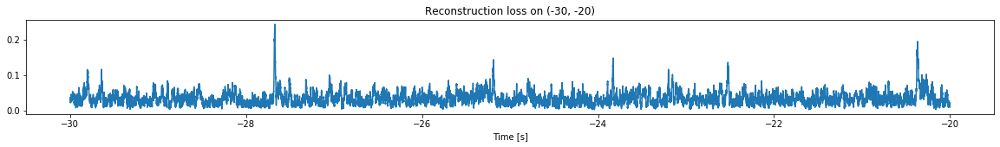

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


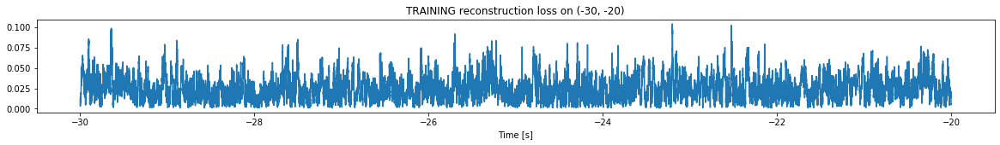

Finished training, median of the log(loss) is:  -1.6515265398984862
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7327212933871263
Triggering threshold is:  1.6


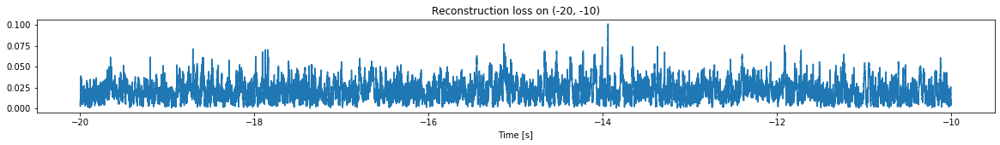

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


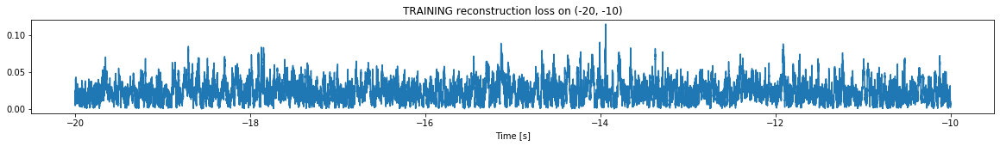

Finished training, median of the log(loss) is:  -1.6529522802302288
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6515265398984862
Triggering threshold is:  1.6


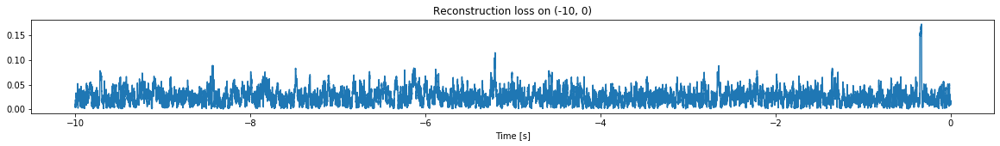

<--------


AttributeError: 'NoneType' object has no attribute 'shape'

In [41]:
simulation("Ramp_10", "15T_data", 10,  time_range = (-50,0), reached_max = -2.75)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


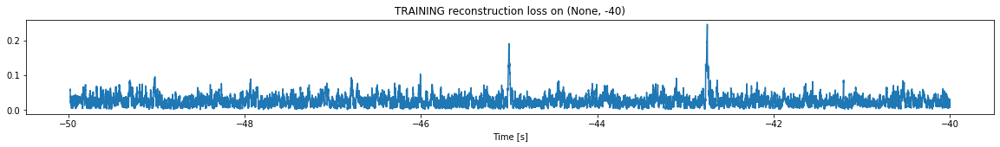

Finished training, median of the log(loss) is:  -1.637263407655051
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


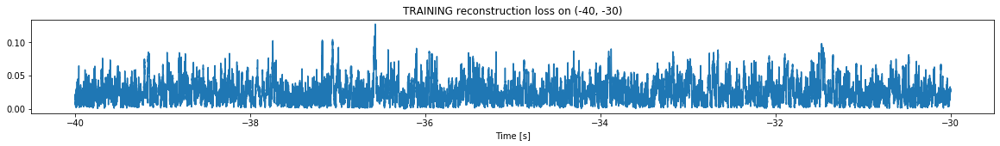

Finished training, median of the log(loss) is:  -1.6382057677407103
Triggering for section:  (-30, -20)
Using this median for triggering: -1.637263407655051
Triggering threshold is:  3.0


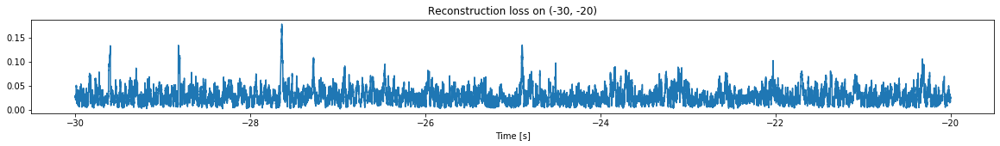

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


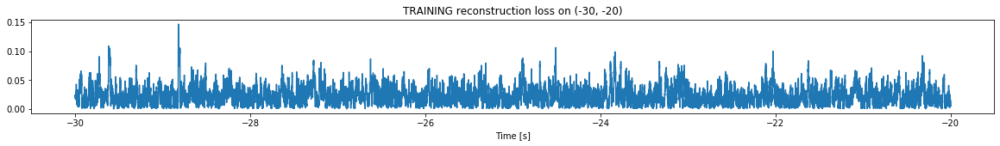

Finished training, median of the log(loss) is:  -1.6870865209842165
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6382057677407103
Triggering threshold is:  1.6


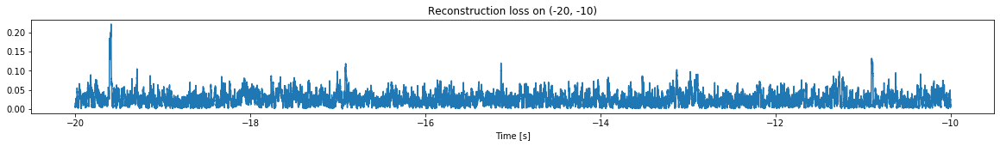

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


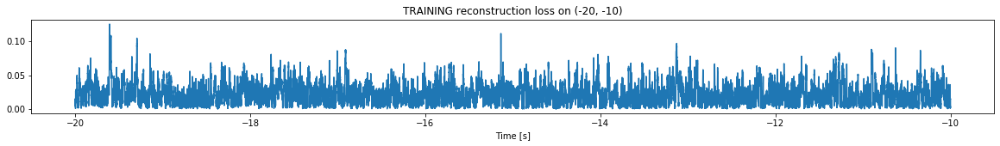

Finished training, median of the log(loss) is:  -1.7104570274561914
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6870865209842165
Triggering threshold is:  1.6


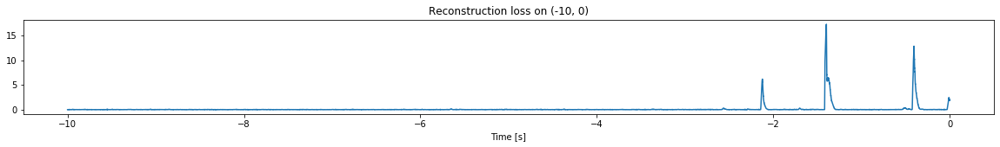

Other trigger time:  [-2.1239     -1.3987     -0.40559998]
Their log loss values are:  [2.47772465 2.92375567 2.79496665]


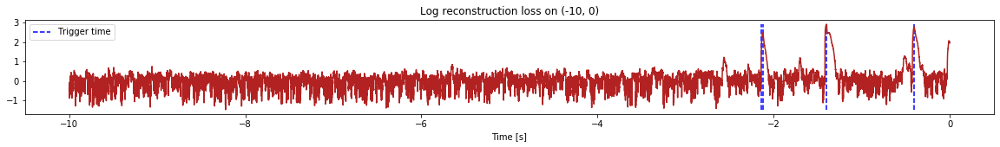

Triggered at:  [-2.1239, -1.3987, -0.40559998]
Latent coordinates are:  [[-0.9983692, 7.986213], [-0.99999994, 24.547674], [-0.9999975, 15.390786]]
<--------
Normal latent's shape:  (99996, 2)


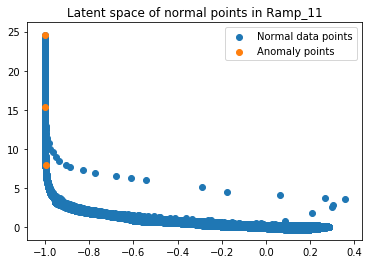

Finished simulation, all the triggered times are:  [-2.1239, -1.3987, -0.40559998]

All latent coordinate:  [[-0.9983692, 7.986213], [-0.99999994, 24.547674], [-0.9999975, 15.390786]]


In [42]:
simulation("Ramp_11", "15T_data", 10,  time_range = (-50,0), reached_max = -1.95)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


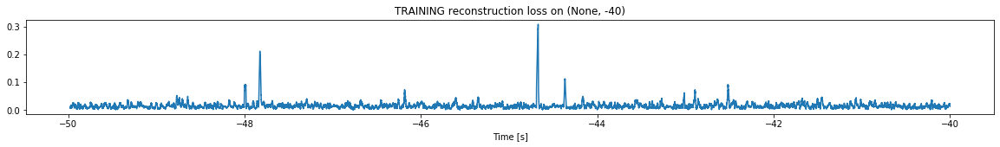

Finished training, median of the log(loss) is:  -1.8659931712457591
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


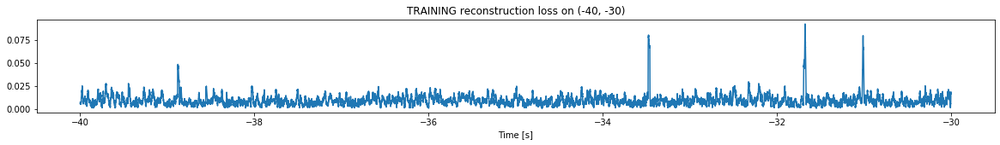

Finished training, median of the log(loss) is:  -2.089472064838545
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8659931712457591
Triggering threshold is:  3.0


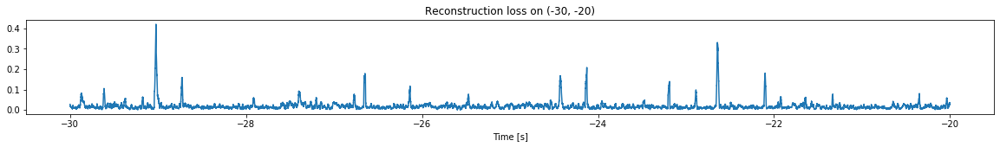

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


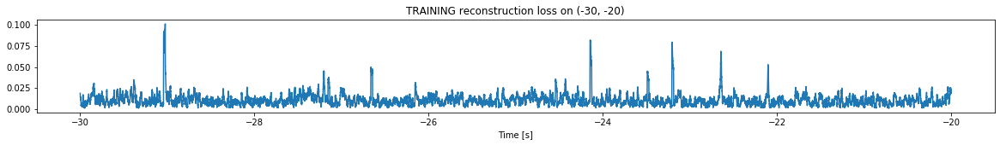

Finished training, median of the log(loss) is:  -2.024271537140415
Triggering for section:  (-20, -10)
Using this median for triggering: -2.089472064838545
Triggering threshold is:  1.6


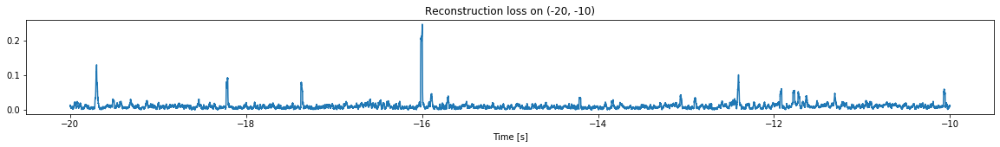

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


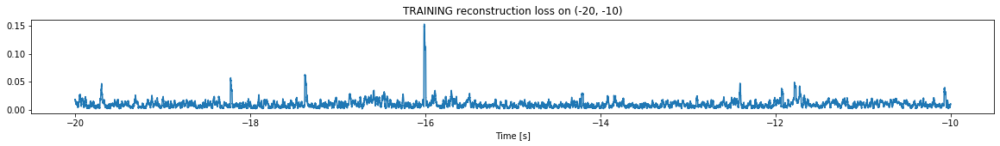

Finished training, median of the log(loss) is:  -2.0699073063250886
Triggering for section:  (-10, 0)
Using this median for triggering: -2.024271537140415
Triggering threshold is:  1.6


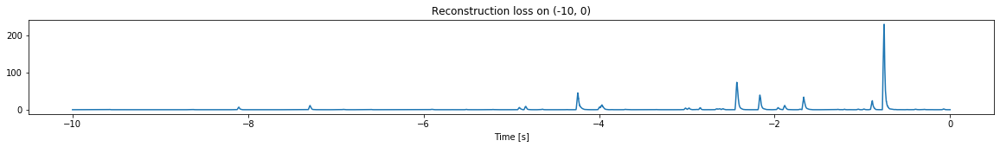

Other trigger time:  [-9.573999 -8.625899 -8.1044   -7.2935   -6.5983   -5.911    -4.8374
 -4.2426   -3.699    -2.9743   -2.431    -1.668    -0.7522   -0.0749  ]
Their log loss values are:  [1.88195073 1.92091785 2.86598207 3.07907814 1.79691118 2.00970639
 2.9747117  3.67655217 2.05150081 2.68641541 3.89026228 3.55300303
 4.38478054 2.38519465]


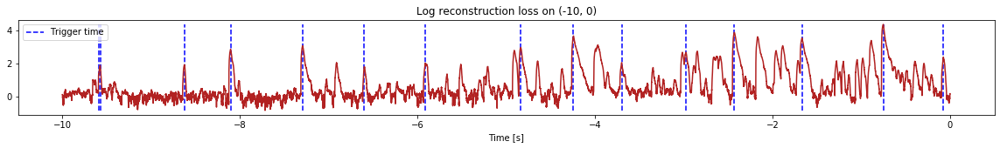

Triggered at:  [-9.573999, -8.625899, -8.1044, -7.2935, -6.5983, -5.911, -4.8374, -4.2426, -3.699, -2.9743, -2.431, -1.668, -0.7522, -0.0749]
Latent coordinates are:  [[1.5523446, -0.6216898], [1.7329894, -0.62132275], [-0.9964549, -0.99993443], [-0.9994811, -0.99999994], [-0.5198596, -0.6925013], [0.28996116, -0.80580354], [-0.97037446, -0.99999756], [-1.0, -1.0], [0.67746943, -0.8156433], [1.0842632, -0.9976833], [-1.0, -1.0], [-1.0, -1.0], [-1.0, -1.0], [-0.6164915, -0.9641755]]
<--------
Normal latent's shape:  (99985, 2)


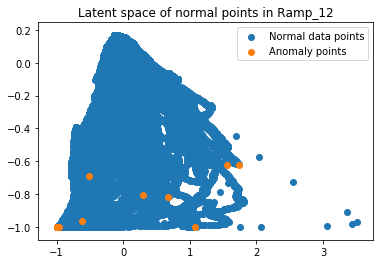

Finished simulation, all the triggered times are:  [-9.573999, -8.625899, -8.1044, -7.2935, -6.5983, -5.911, -4.8374, -4.2426, -3.699, -2.9743, -2.431, -1.668, -0.7522, -0.0749]

All latent coordinate:  [[1.5523446, -0.6216898], [1.7329894, -0.62132275], [-0.9964549, -0.99993443], [-0.9994811, -0.99999994], [-0.5198596, -0.6925013], [0.28996116, -0.80580354], [-0.97037446, -0.99999756], [-1.0, -1.0], [0.67746943, -0.8156433], [1.0842632, -0.9976833], [-1.0, -1.0], [-1.0, -1.0], [-1.0, -1.0], [-0.6164915, -0.9641755]]


In [43]:
simulation("Ramp_12", "15T_data", 10,  time_range = (-50,0), reached_max = -4.95)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


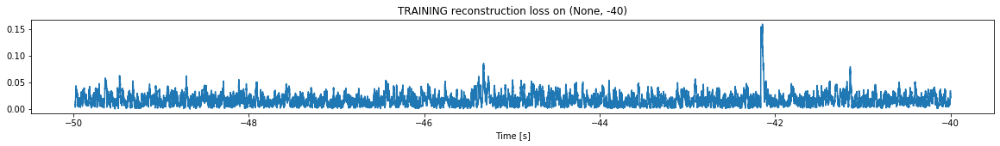

Finished training, median of the log(loss) is:  -1.8186250979021719
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


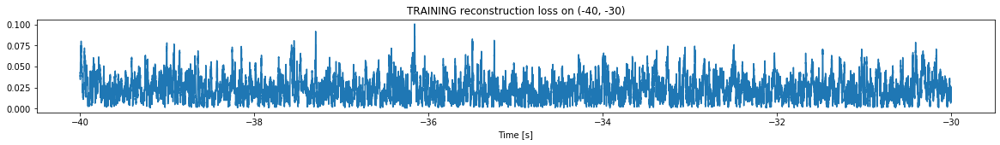

Finished training, median of the log(loss) is:  -1.6742169354035132
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8186250979021719
Triggering threshold is:  3.0


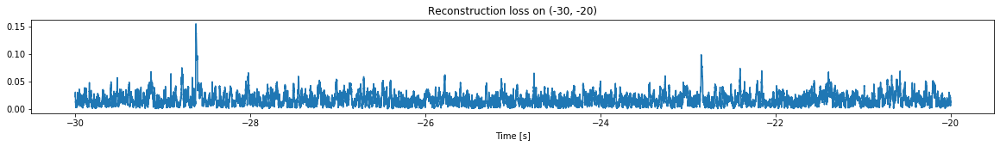

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


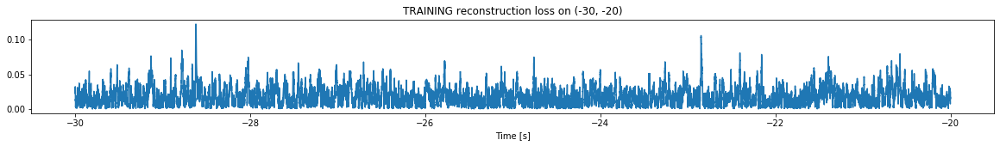

Finished training, median of the log(loss) is:  -1.7932860096993548
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6742169354035132
Triggering threshold is:  1.6


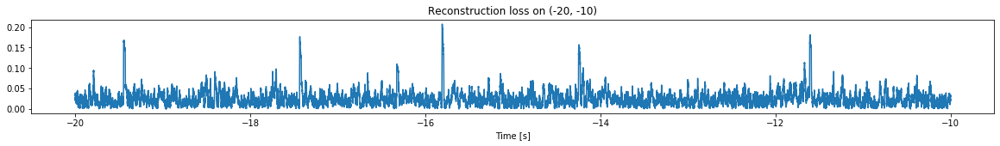

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


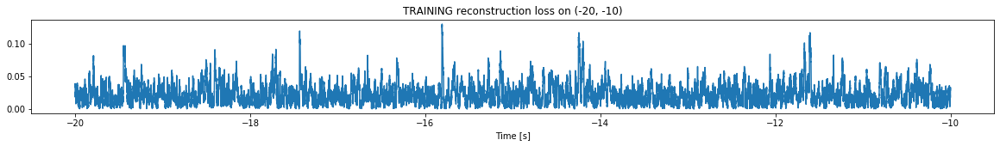

Finished training, median of the log(loss) is:  -1.688295238625238
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7932860096993548
Triggering threshold is:  1.6


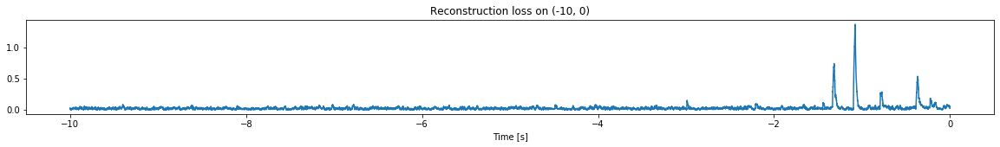

Other trigger time:  [-1.078]
Their log loss values are:  [1.93396047]


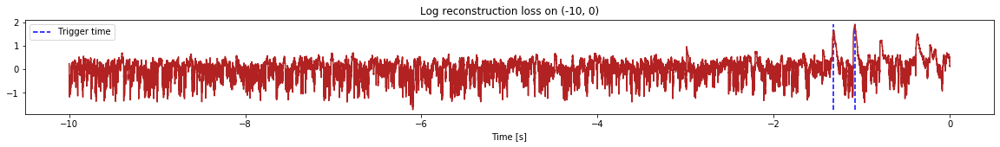

Triggered at:  [-1.078]
Latent coordinates are:  [[5.5911016, 8.482569]]
<--------
Normal latent's shape:  (99998, 2)


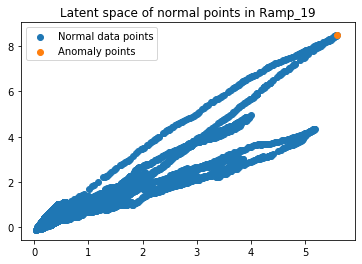

Finished simulation, all the triggered times are:  [-1.078]

All latent coordinate:  [[5.5911016, 8.482569]]


In [44]:
simulation("Ramp_19", "15T_data", 10,  time_range = (-50,0), reached_max = -2.15)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


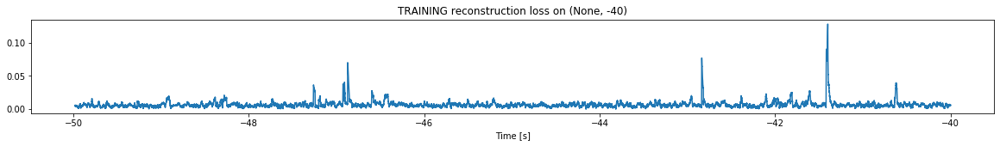

Finished training, median of the log(loss) is:  -2.2282549082448426
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


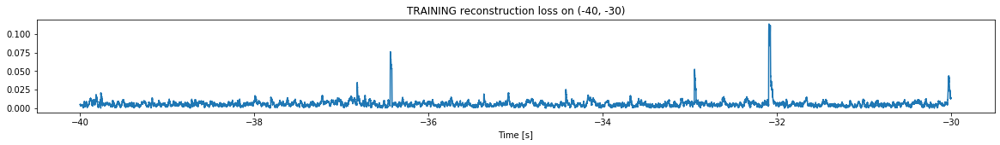

Finished training, median of the log(loss) is:  -2.27154799493401
Triggering for section:  (-30, -20)
Using this median for triggering: -2.2282549082448426
Triggering threshold is:  3.0


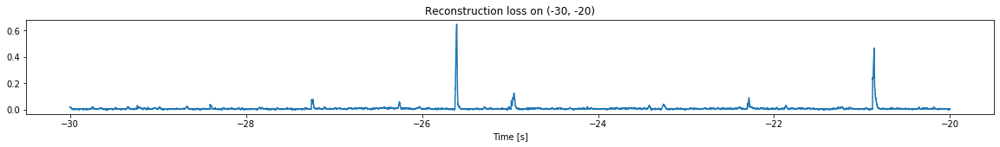

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


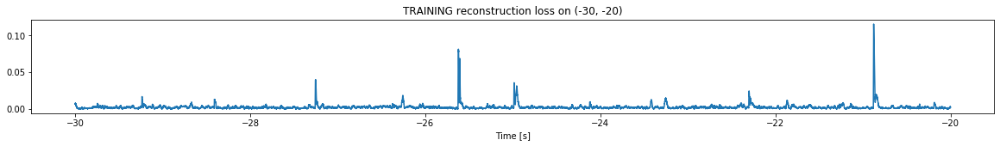

Finished training, median of the log(loss) is:  -2.68796638800311
Triggering for section:  (-20, -10)
Using this median for triggering: -2.27154799493401
Triggering threshold is:  1.6


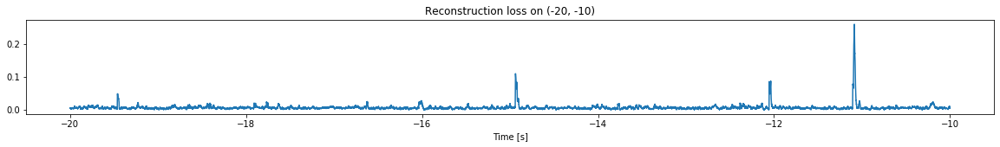

Other trigger time:  [-11.0869]
Their log loss values are:  [1.68826663]


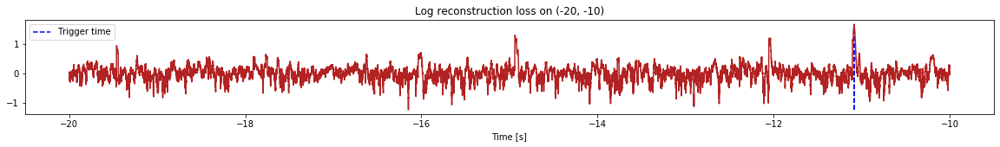

Triggered at:  [-11.0869]
Latent coordinates are:  [[2.241675, 1.1991863]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


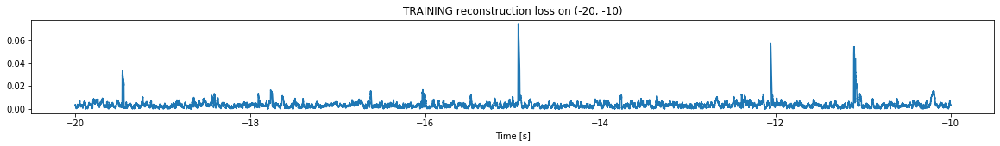

Finished training, median of the log(loss) is:  -2.4995591568698585
Triggering for section:  (-10, 0)
Using this median for triggering: -2.68796638800311
Triggering threshold is:  1.6


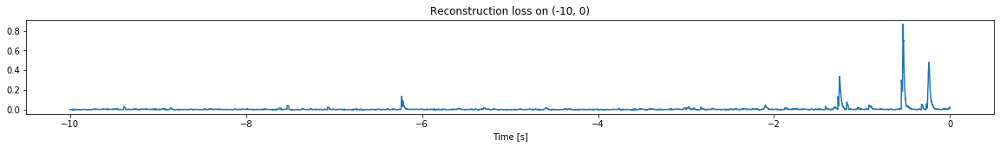

Other trigger time:  [-6.2345     -1.2545999  -0.53459996]
Their log loss values are:  [1.82050482 2.21328837 2.62557247]


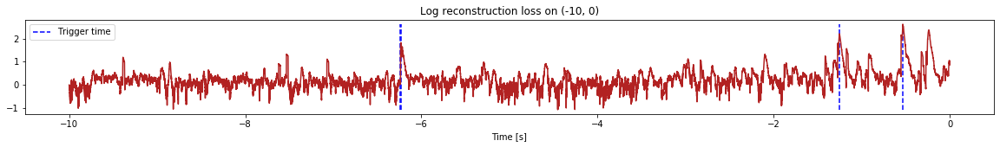

Triggered at:  [-6.2345, -1.2545999, -0.53459996]
Latent coordinates are:  [[0.8539564, 0.3760459], [2.9272323, 2.610756], [-0.2759899, 12.650258]]
<--------
Normal latent's shape:  (99996, 2)


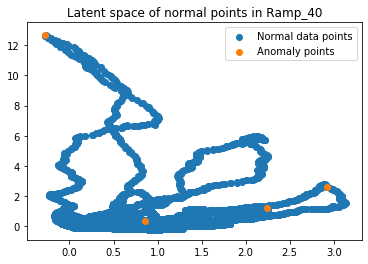

Finished simulation, all the triggered times are:  [-11.0869, -6.2345, -1.2545999, -0.53459996]

All latent coordinate:  [[2.241675, 1.1991863], [0.8539564, 0.3760459], [2.9272323, 2.610756], [-0.2759899, 12.650258]]


In [45]:
simulation("Ramp_40", "15T_data", 10,  time_range = (-50,0), reached_max = -1.95)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


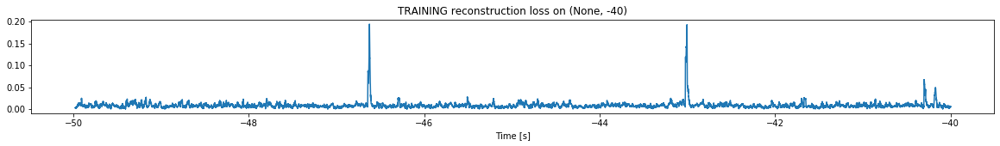

Finished training, median of the log(loss) is:  -2.125057888120576
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


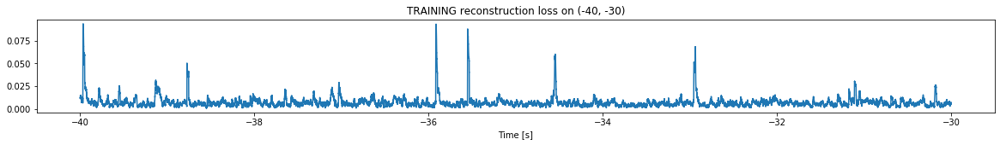

Finished training, median of the log(loss) is:  -2.236098488289132
Triggering for section:  (-30, -20)
Using this median for triggering: -2.125057888120576
Triggering threshold is:  3.0


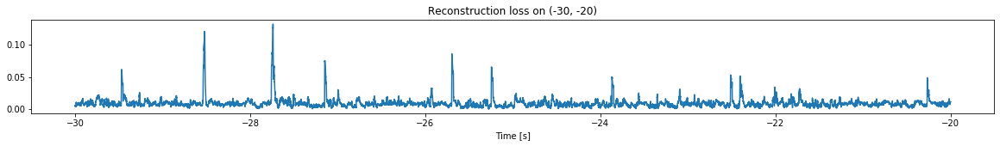

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


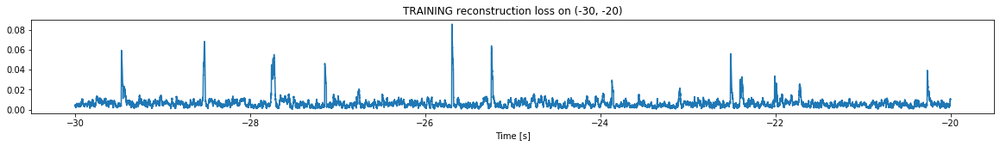

Finished training, median of the log(loss) is:  -2.27552993436362
Triggering for section:  (-20, -10)
Using this median for triggering: -2.236098488289132
Triggering threshold is:  1.6


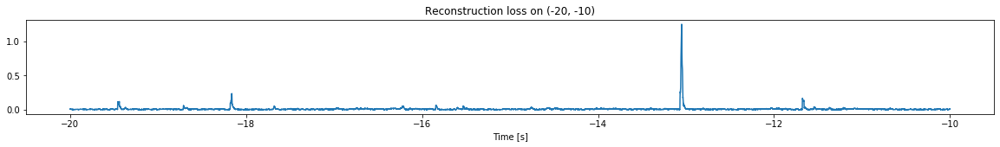

Other trigger time:  [-18.1612 -13.0496]
Their log loss values are:  [1.61057232 2.3333466 ]


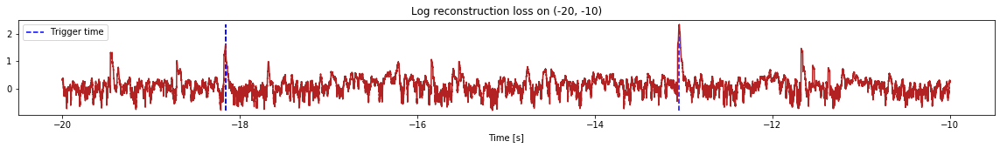

Triggered at:  [-18.1612, -13.0496]
Latent coordinates are:  [[-0.46903408, -0.7342951], [-0.6225629, -0.9573496]]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


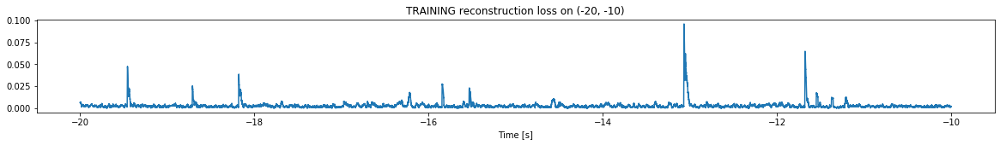

Finished training, median of the log(loss) is:  -2.6027117841087595
Triggering for section:  (-10, 0)
Using this median for triggering: -2.27552993436362
Triggering threshold is:  1.6


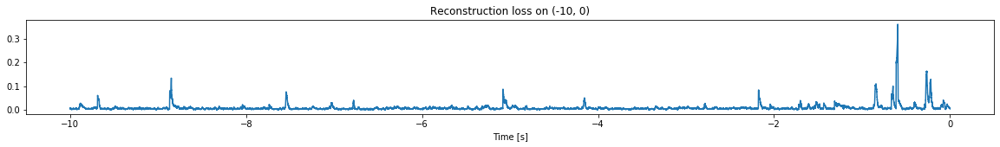

Other trigger time:  [-0.5936]
Their log loss values are:  [1.83244915]


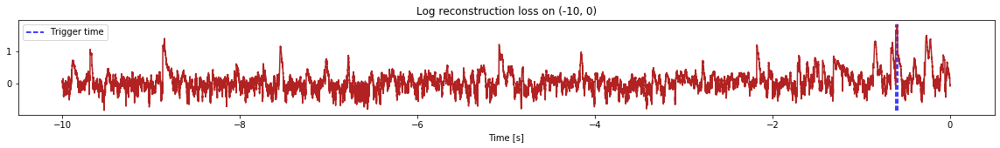

Triggered at:  [-0.5936]
Latent coordinates are:  [[-0.57422125, -0.7652029]]
<--------


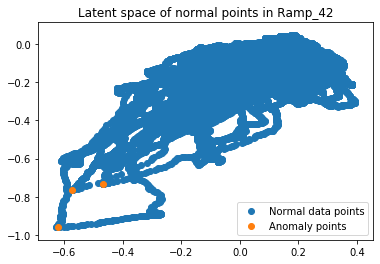

Finished simulation, all the triggered times are:  [-18.1612, -13.0496, -0.5936]

All latent coordinate:  [[-0.46903408, -0.7342951], [-0.6225629, -0.9573496], [-0.57422125, -0.7652029]]


In [50]:
simulation("Ramp_42", "15T_data", 10,  time_range = (-50,0), reached_max = -0.5)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


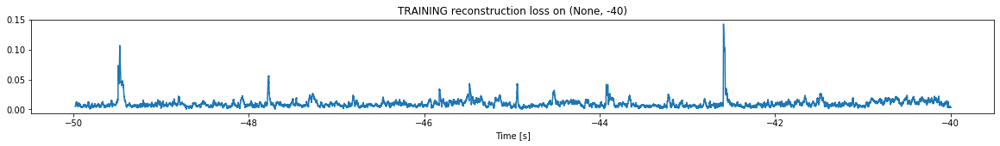

Finished training, median of the log(loss) is:  -2.085310573490947
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


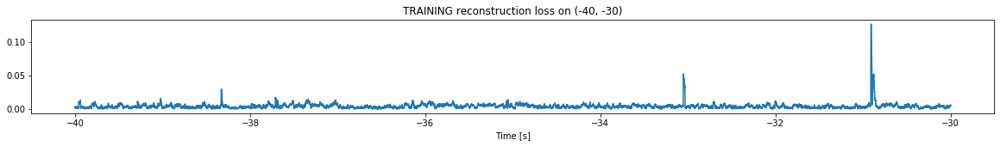

Finished training, median of the log(loss) is:  -2.425715861398245
Triggering for section:  (-30, -20)
Using this median for triggering: -2.085310573490947
Triggering threshold is:  3.0


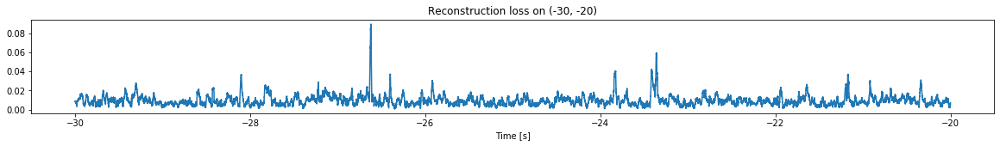

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


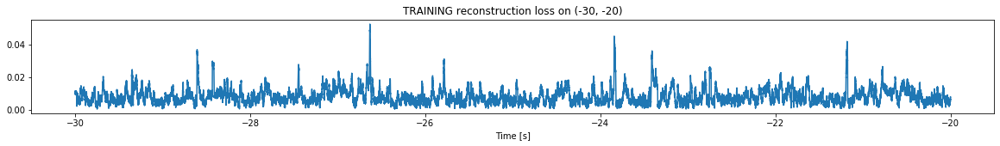

Finished training, median of the log(loss) is:  -2.1463204594607097
Triggering for section:  (-20, -10)
Using this median for triggering: -2.425715861398245
Triggering threshold is:  1.6


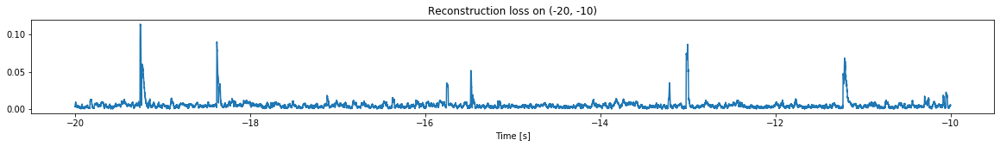

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


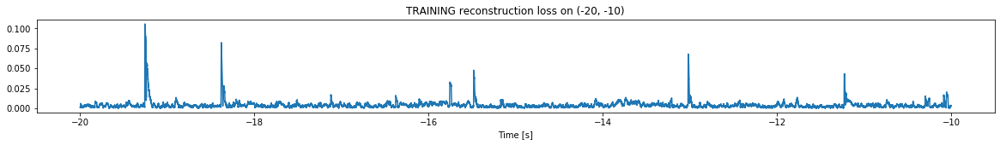

Finished training, median of the log(loss) is:  -2.49066737213977
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1463204594607097
Triggering threshold is:  1.6


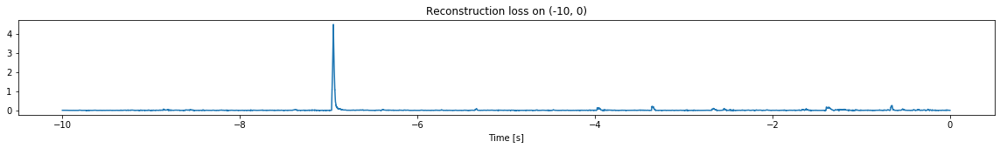

Other trigger time:  [-6.9467998]
Their log loss values are:  [2.79789143]


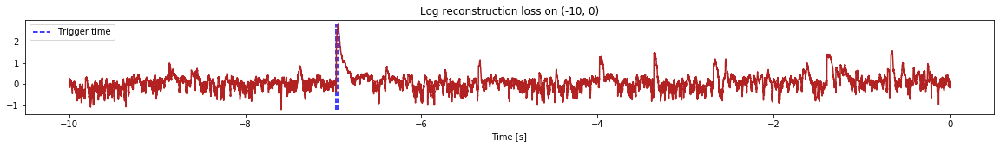

Triggered at:  [-6.9467998]
Latent coordinates are:  [[-0.9838101, 24.326778]]
<--------
Normal latent's shape:  (99998, 2)


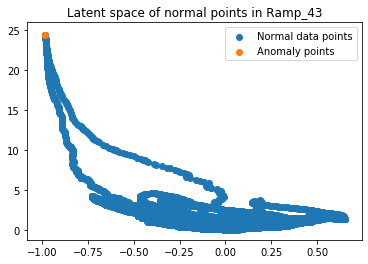

Finished simulation, all the triggered times are:  [-6.9467998]

All latent coordinate:  [[-0.9838101, 24.326778]]


In [47]:
simulation("Ramp_43", "15T_data", 10,  time_range = (-50,0), reached_max = -1.15)

Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


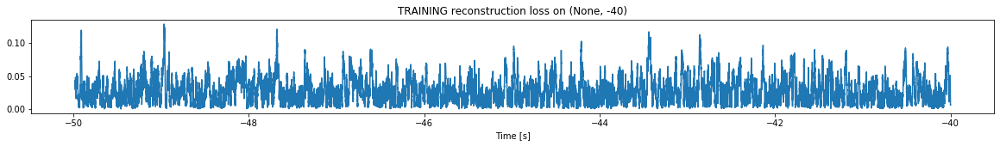

Finished training, median of the log(loss) is:  -1.631212349397828
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


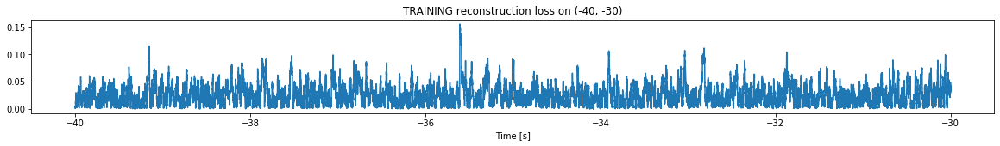

Finished training, median of the log(loss) is:  -1.6528889375890068
Triggering for section:  (-30, -20)
Using this median for triggering: -1.631212349397828
Triggering threshold is:  3.0


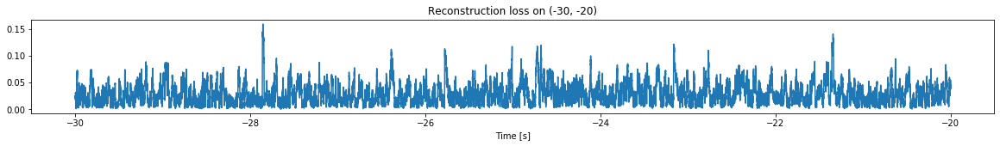

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


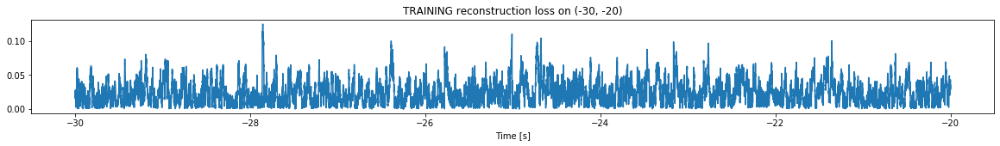

Finished training, median of the log(loss) is:  -1.6904515516437053
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6528889375890068
Triggering threshold is:  1.6


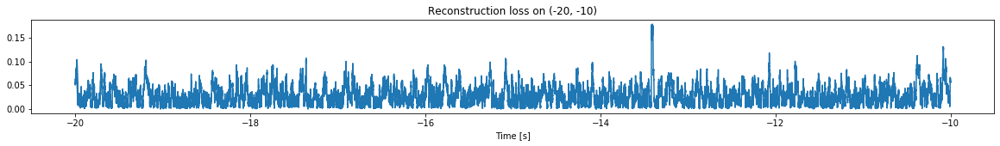

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


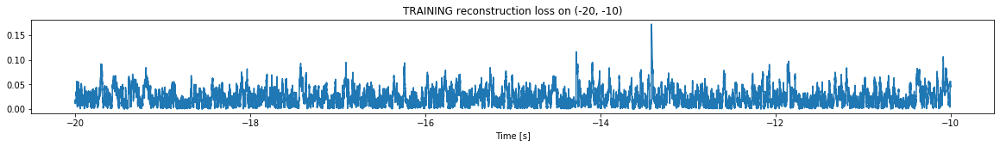

Finished training, median of the log(loss) is:  -1.7015411791793253
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6904515516437053
Triggering threshold is:  1.6


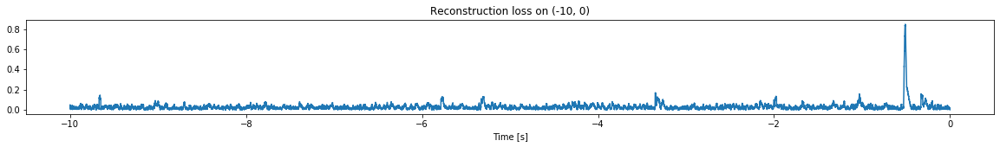

Other trigger time:  [-0.5082]
Their log loss values are:  [1.61881592]


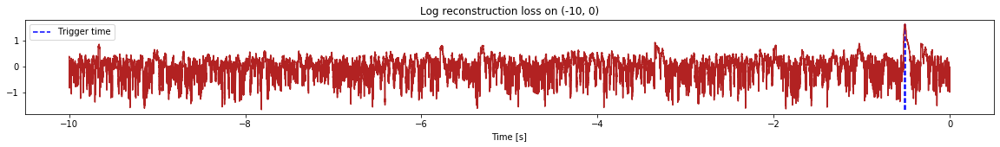

Triggered at:  [-0.5082]
Latent coordinates are:  [[4.9254427, 10.478712]]
<--------
Normal latent's shape:  (99998, 2)


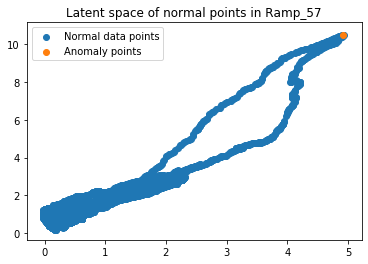

Finished simulation, all the triggered times are:  [-0.5082]

All latent coordinate:  [[4.9254427, 10.478712]]


In [48]:
simulation("Ramp_57", "15T_data", 10,  time_range = (-50,0), reached_max = -1.55)

--------

# Latent space heat map with reconstruction loss

In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import tensorflow as tf
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

def load_sensor(ramp_num, dir_path, sensor, time_range = None):
    """
    Load a sensor's data in the specified time range.
    
    Example usage: load_sensor("Ramp_7", "15T_data", 0, time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - sensor (int): sensor index (0 or 1)
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified sensor in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    df_data = pd.DataFrame(data = {"dummy": data[sensor, :][selection_index]})
    
    #Return the sensor's data accoring to the index 
    return df_data["dummy"]
    
    %reset -f in
    
def load_time_label(ramp_num, dir_path, time_range = None, window = 2000, step = 10):
    """
    Load a ramp time axis in a specified range.
    
    Example usage: load_time_label("Ramp_7", "15T_data", time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified time axis in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    %reset -f in
    
    return time_axis[selection_index][window-1::step]


#### Mean of abs(signal)
def generate_mean_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1, product)).transpose()
    
    %reset -f in
    
    return all_sd

def generate_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(ramp_num, dir_path, time_range, window = window, step = step)
    moving_sd = generate_sd_data(ramp_num, dir_path, time_range, window = window, step = step)
    time_label = load_time_label(ramp_num, dir_path, time_range, window = window, step = step)
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label


############DYNAMIC LEARNING IMPLEMENTATION############
def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(4, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=6))

    model.add(Dense(2,activation='elu',
                    kernel_initializer='glorot_uniform', name = 'latent_space'))

    model.add(Dense(4,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def get_latent_output(model_weights, X):
    
    model = create_model()  # create the original model
    model.set_weights(model_weights)

    layer_name = 'latent_space'
    intermediate_layer_model = keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    intermediate_layer_model.compile(loss='mse',optimizer='adam')
    
    intermediate_output = intermediate_layer_model.predict(X)
    
    return intermediate_output

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Get latent space output
    latent_space = get_latent_output(current_weights, X_test)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        #Get latent space of normal data points
        #normal_latent = np.delete(latent_space, peaks, 0)
        #normal_log_test_loss = np.delete(log_test_loss, peaks, 0)
        
        return list(time_test[peaks]), [list(x) for x in list(latent_space[peaks])], latent_space, log_test_loss, time_test
    
    else:
        return None, None, None, None, None
    

def simulation(ramp_num, dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(ramp_num, dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Keep track of latent coordinate of trigger time
    latent_coor = []
    
    #Keep track of normal latent space
    latent_normal_coord = None
    
    #Test loss associated with latent space
    all_test_loss = None
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 3, end_thres = 1.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
               
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time, trigger_latent, normal_latent, log_test_loss, time_test = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
                
                print("Latent coordinates are: ", trigger_latent)
                latent_coor.extend(trigger_latent)
                
                if latent_normal_coord is None:
                    latent_normal_coord = normal_latent
                else:
                    latent_normal_coord = np.append(latent_normal_coord, normal_latent, 0)
                    
                if all_test_loss is None:
                    all_test_loss = log_test_loss
                else:
                    all_test_loss = np.append(all_test_loss, log_test_loss, 0)
        
        print("<--------")
        
    
    #Create the animation here.
    
    #Plot latent space of normal data points
    # Sort the points by density, so that the densest points are plotted last
    idx = all_test_loss.argsort()
    sorted_latent_normal_coord, sorted_all_test_loss  = latent_normal_coord[idx, :], all_test_loss[idx]
    
    fig, ax = plt.subplots()
    norm_latent = ax.scatter(sorted_latent_normal_coord[:, 0], sorted_latent_normal_coord[:,1], c = sorted_all_test_loss, edgecolor='', cmap = 'inferno')
    ax.scatter([x[0] for x in latent_coor], [x[1] for x in latent_coor], color = 'red', label = "Anomaly events")
    plt.title("Latent space of normal points in {}".format(ramp_num))
    plt.legend(loc = 'best')
    
    #Set color bar
    cbar = plt.colorbar(norm_latent)
    cbar.set_label(r'$\log_{10}$(loss)')
    plt.show()
    
    return latent_normal_coord, all_test_loss, latent_coor, all_test_loss, time_test

    print("Finished simulation, all the triggered times are: ", trigger_log)
    print()
    print("All latent coordinate: ", latent_coor)


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


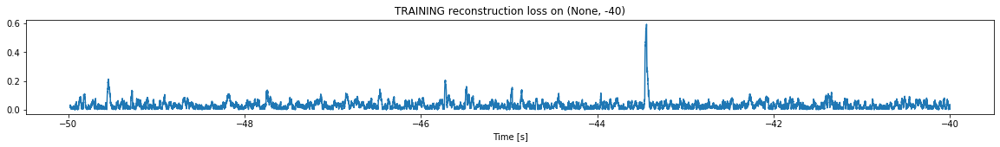

Finished training, median of the log(loss) is:  -1.5812868280624925
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


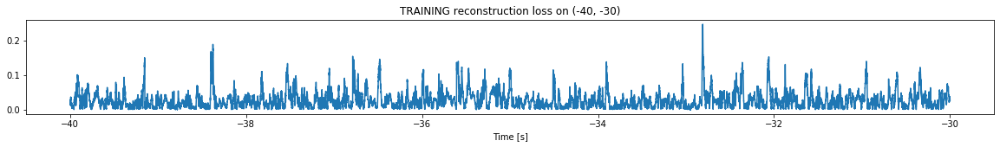

Finished training, median of the log(loss) is:  -1.6561041379888075
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5812868280624925
Triggering threshold is:  3.0


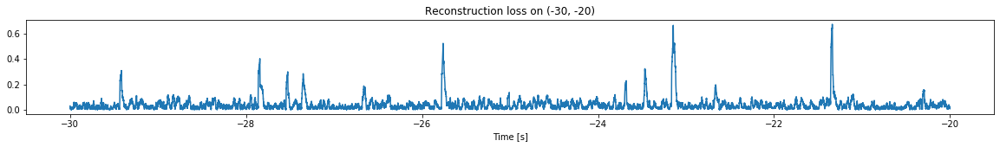

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


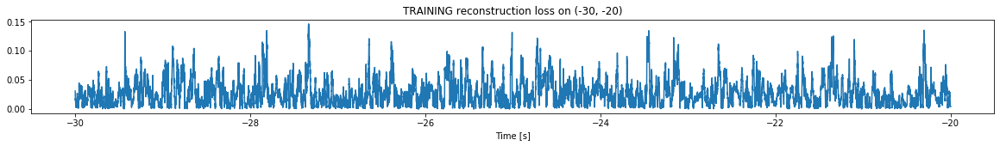

Finished training, median of the log(loss) is:  -1.635454311451864
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6561041379888075
Triggering threshold is:  1.6


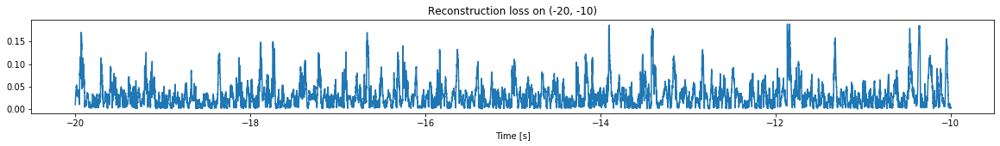

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


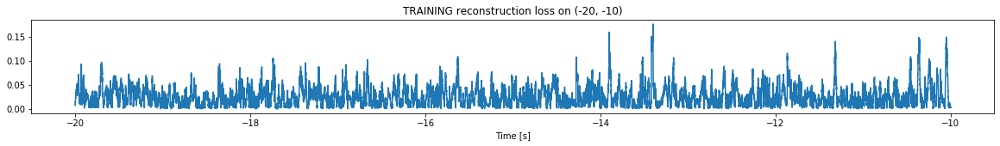

Finished training, median of the log(loss) is:  -1.6702287932616597
Triggering for section:  (-10, 0)
Using this median for triggering: -1.635454311451864
Triggering threshold is:  1.6


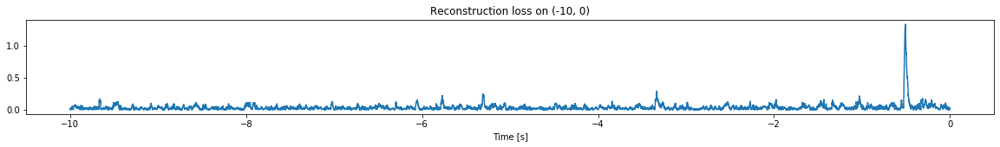

Other trigger time:  [-0.5082]
Their log loss values are:  [1.75965299]


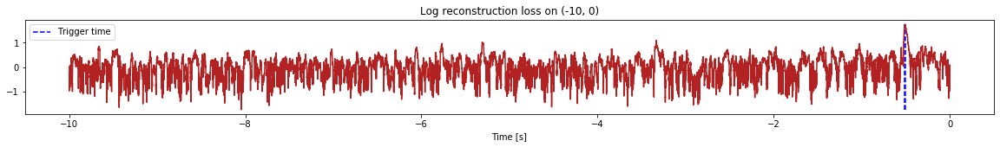

Triggered at:  [-0.5082]
Latent coordinates are:  [[-0.43265474, 7.4060373]]
<--------


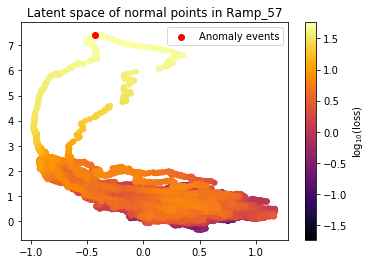

In [2]:
latent_normal_coord, all_test_loss, latent_coor, all_test_loss, time_test  = simulation("Ramp_57", "15T_data", 10,  time_range = (-50,0), reached_max = -1.55)

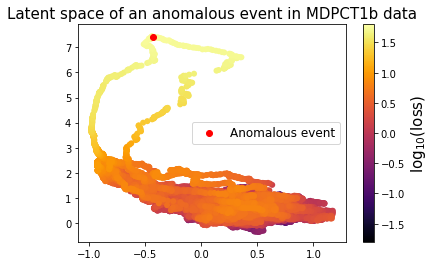

In [43]:
fig, ax = plt.subplots()
#Plot latent space of normal data points
# Sort the points by density, so that the densest points are plotted last
idx = all_test_loss.argsort()
sorted_latent_normal_coord, sorted_all_test_loss  = latent_normal_coord[idx, :], all_test_loss[idx]

norm_latent = ax.scatter(sorted_latent_normal_coord[:, 0], sorted_latent_normal_coord[:,1], c = sorted_all_test_loss, edgecolor='', cmap = 'inferno',
                        vmin=-1.8, vmax=1.8)
ax.scatter([x[0] for x in latent_coor], [x[1] for x in latent_coor], color = 'red', label = "Anomalous event")
plt.title("Latent space of an anomalous event in MDPCT1b data", fontsize = 15)
plt.legend(loc = 'best', fontsize = 12)

#plt.xlim([-1.5,1.5])
#plt.ylim([-1,8])
#Set color bar
cbar = plt.colorbar(norm_latent)
cbar.set_label(r'$\log_{10}$(loss)', fontsize = 15)
plt.savefig('./figures/mdpct1b_latent.pdf', bbox_inches = 'tight')
plt.show()

In [44]:
!pwd

/uscms_data/d3/dhoang/quench-detector


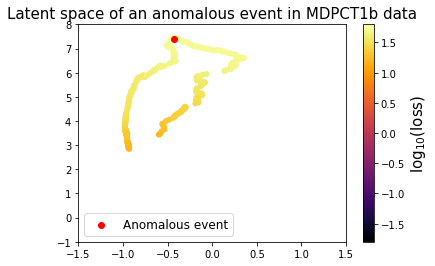

In [38]:
selection_index = all_test_loss > 1.2
fig, ax = plt.subplots()
norm_latent = ax.scatter(latent_normal_coord[:, 0][selection_index], latent_normal_coord[:,1][selection_index], c = all_test_loss[selection_index], edgecolor='', cmap = 'inferno',
                        vmin=-1.8, vmax=1.8)
ax.scatter([x[0] for x in latent_coor], [x[1] for x in latent_coor], color = 'red', label = "Anomalous event")
plt.title("Latent space of an anomalous event in MDPCT1b data", fontsize = 15)
plt.legend(loc = 'best', fontsize = 12)

plt.xlim([-1.5,1.5])
plt.ylim([-1,8])

#Set color bar
cbar = plt.colorbar(norm_latent)
cbar.set_label(r'$\log_{10}$(loss)', fontsize = 15)
plt.show()

-0.5234
-0.479


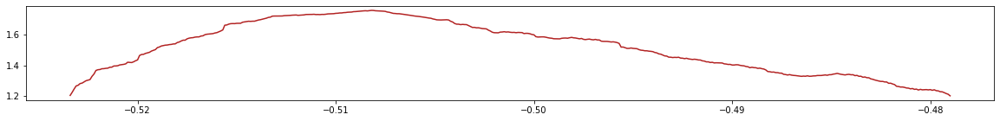

In [27]:
fig, ax = plt.subplots(figsize=(20,2))
plt.plot(time_test[selection_index], all_test_loss[selection_index], color = "firebrick")
print(time_test[selection_index].min())
print(time_test[selection_index].max())

Text(0.5, 0, 'Time [s]')

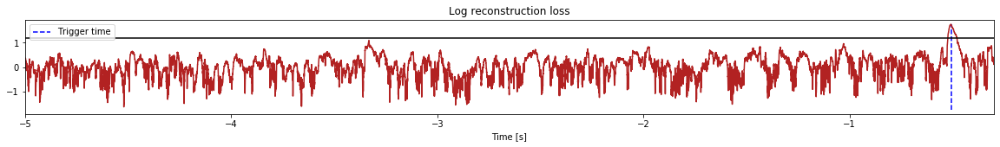

In [40]:
fig, ax = plt.subplots(figsize=(20,2))
plt.plot(time_test, all_test_loss, color = "firebrick")
#Trigger time
plt.vlines(-0.5082, all_test_loss.min(), all_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
ax.axhline(1.2, color = "black")
plt.xlim([-5,-0.3])
plt.legend(loc = "best")
plt.title("Log reconstruction loss")
plt.xlabel("Time [s]")

## Latent space with animation

In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import tensorflow as tf
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility

def load_sensor(ramp_num, dir_path, sensor, time_range = None):
    """
    Load a sensor's data in the specified time range.
    
    Example usage: load_sensor("Ramp_7", "15T_data", 0, time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - sensor (int): sensor index (0 or 1)
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified sensor in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    df_data = pd.DataFrame(data = {"dummy": data[sensor, :][selection_index]})
    
    #Return the sensor's data accoring to the index 
    return df_data["dummy"]
    
    %reset -f in
    
def load_time_label(ramp_num, dir_path, time_range = None, window = 2000, step = 10):
    """
    Load a ramp time axis in a specified range.
    
    Example usage: load_time_label("Ramp_7", "15T_data", time_range = (-20,0))
    
    Args:
     - ramp_num (str): ramp number
     - dir_path (str): path to directory containing all the ramp's data
     - time_range (tuple): time range in which the data should be loaded
    
    Returns: The specified time axis in specified time range
    """
    
    needed_file = None
    
    #Scan the directory for correct ramp file
    for filename in os.listdir(dir_path):
        if filename.startswith(ramp_num):
            needed_file = dir_path + "/" + filename
            
    #Load the file
    f = h5py.File(needed_file,'r')
    data = np.array(f['chanvals'], dtype = 'float16')
    
    #Load time
    time_axis = np.load(dir_path + "/time_axis/" + ramp_num + "_time.npy")
    
    #Calculate index for selecting data
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1])
    
    %reset -f in
    
    return time_axis[selection_index][window-1::step]


#### Mean of abs(signal)
def generate_mean_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(ramp_num, dir_path, 0, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(ramp_num, dir_path, 1, time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1, product)).transpose()
    
    %reset -f in
    
    return all_sd

def generate_data(ramp_num, dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(ramp_num, dir_path, time_range, window = window, step = step)
    moving_sd = generate_sd_data(ramp_num, dir_path, time_range, window = window, step = step)
    time_label = load_time_label(ramp_num, dir_path, time_range, window = window, step = step)
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label


############DYNAMIC LEARNING IMPLEMENTATION############
def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(4, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=6))

    model.add(Dense(2,activation='elu',
                    kernel_initializer='glorot_uniform', name = 'latent_space'))

    model.add(Dense(4,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def get_latent_output(model_weights, X):
    
    model = create_model()  # create the original model
    model.set_weights(model_weights)

    layer_name = 'latent_space'
    intermediate_layer_model = keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    intermediate_layer_model.compile(loss='mse',optimizer='adam')
    
    intermediate_output = intermediate_layer_model.predict(X)
    
    return intermediate_output

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Get latent space output
    latent_space = get_latent_output(current_weights, X_test)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        #Get latent space of normal data points
        normal_latent = np.delete(latent_space, peaks, 0)
        normal_log_test_loss = np.delete(log_test_loss, peaks, 0)
        
        return list(time_test[peaks]), [list(x) for x in list(latent_space[peaks])], normal_latent, normal_log_test_loss
    
    else:
        return None, None, None, None
    

def simulation(ramp_num, dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(ramp_num, dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Keep track of latent coordinate of trigger time
    latent_coor = []
    
    #Keep track of normal latent space
    latent_normal_coord = None
    
    #Test loss associated with latent space
    all_test_loss = None
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 3, end_thres = 1.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
               
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time, trigger_latent, normal_latent, log_test_loss = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
                
                print("Latent coordinates are: ", trigger_latent)
                latent_coor.extend(trigger_latent)
                
                if latent_normal_coord is None:
                    latent_normal_coord = normal_latent
                else:
                    latent_normal_coord = np.append(latent_normal_coord, normal_latent, 0)
                    
                if all_test_loss is None:
                    all_test_loss = log_test_loss
                else:
                    all_test_loss = np.append(all_test_loss, log_test_loss, 0)
        
        print("<--------")
        
    
    #Create the animation here.
    
    #Plot latent space of normal data points
    # Sort the points by density, so that the densest points are plotted last
    idx = all_test_loss.argsort()
    sorted_latent_normal_coord, sorted_all_test_loss  = latent_normal_coord[idx, :], all_test_loss[idx]
    
    fig, ax = plt.subplots()
    norm_latent = ax.scatter(sorted_latent_normal_coord[:, 0], sorted_latent_normal_coord[:,1], c = sorted_all_test_loss, edgecolor='', cmap = 'inferno')
    ax.scatter([x[0] for x in latent_coor], [x[1] for x in latent_coor], color = 'red', label = "Anomaly events")
    plt.title("Latent space of normal points in {}".format(ramp_num))
    plt.legend(loc = 'best')
    
    #Set color bar
    cbar = plt.colorbar(norm_latent)
    cbar.set_label(r'$\log_{10}$(loss)')
    plt.show()
    
    
    print("Finished simulation, all the triggered times are: ", trigger_log)
    print()
    print("All latent coordinate: ", latent_coor)
    
    #For animation
    return latent_normal_coord, all_test_loss


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 6)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 3.0, 1.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


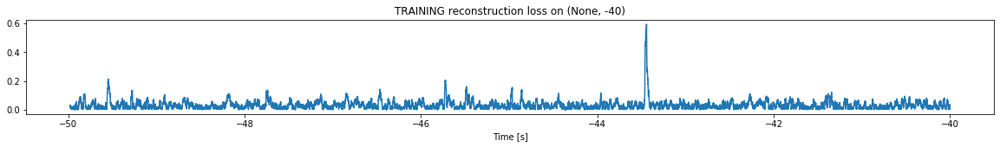

Finished training, median of the log(loss) is:  -1.5813363850451028
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


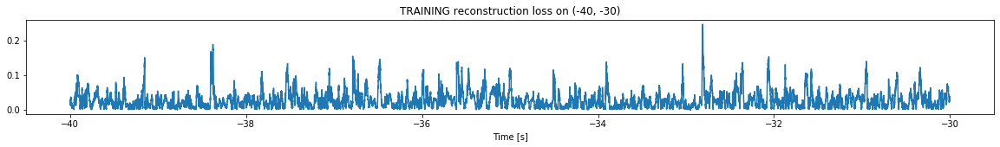

Finished training, median of the log(loss) is:  -1.6563211881272282
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5813363850451028
Triggering threshold is:  3.0


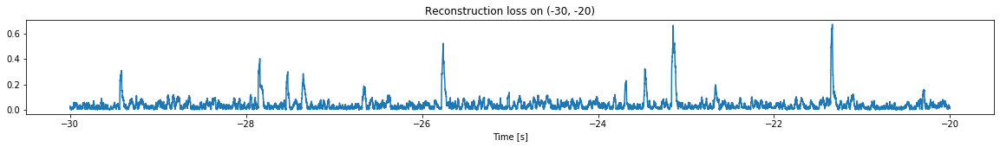

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


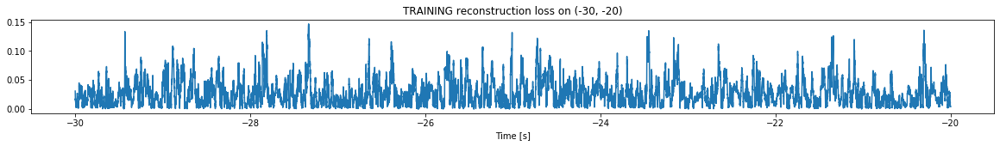

Finished training, median of the log(loss) is:  -1.6356895379750669
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6563211881272282
Triggering threshold is:  1.6


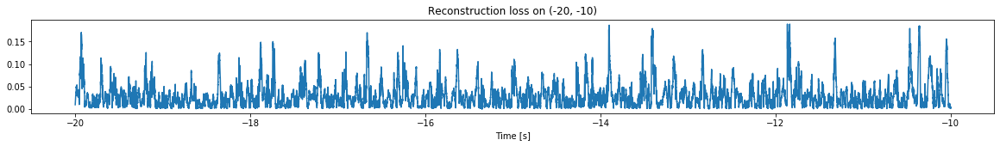

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


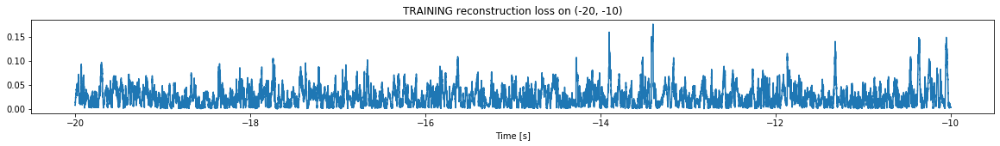

Finished training, median of the log(loss) is:  -1.6703074179101451
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6356895379750669
Triggering threshold is:  1.6


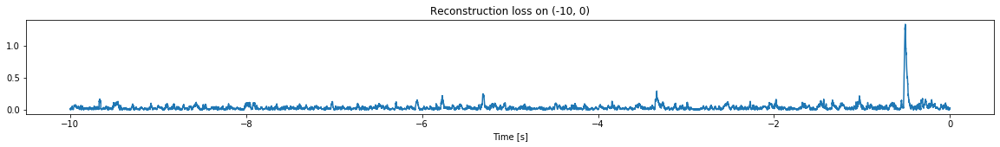

Other trigger time:  [-0.5082]
Their log loss values are:  [1.75961913]


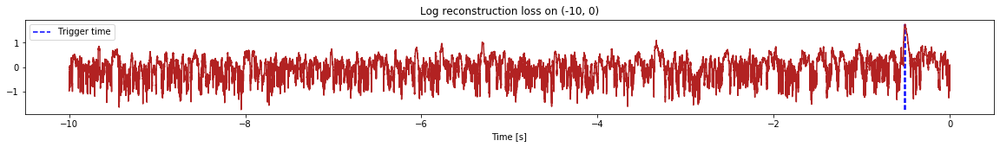

Triggered at:  [-0.5082]
Latent coordinates are:  [[-0.45333248, 7.405867]]
<--------


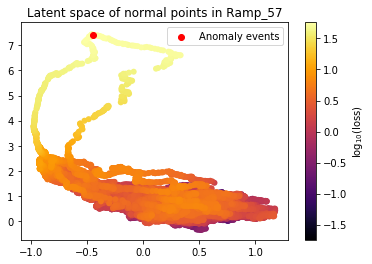

Finished simulation, all the triggered times are:  [-0.5082]

All latent coordinate:  [[-0.45333248, 7.405867]]


In [2]:
latent_normal_coord, all_test_loss = simulation("Ramp_57", "15T_data", 10,  time_range = (-50,0), reached_max = -1.55)

Traceback (most recent call last):
  File "/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py", line 216, in process
    func(*args, **kwargs)
  File "/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/animation.py", line 1465, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


<IPython.core.display.Javascript object>


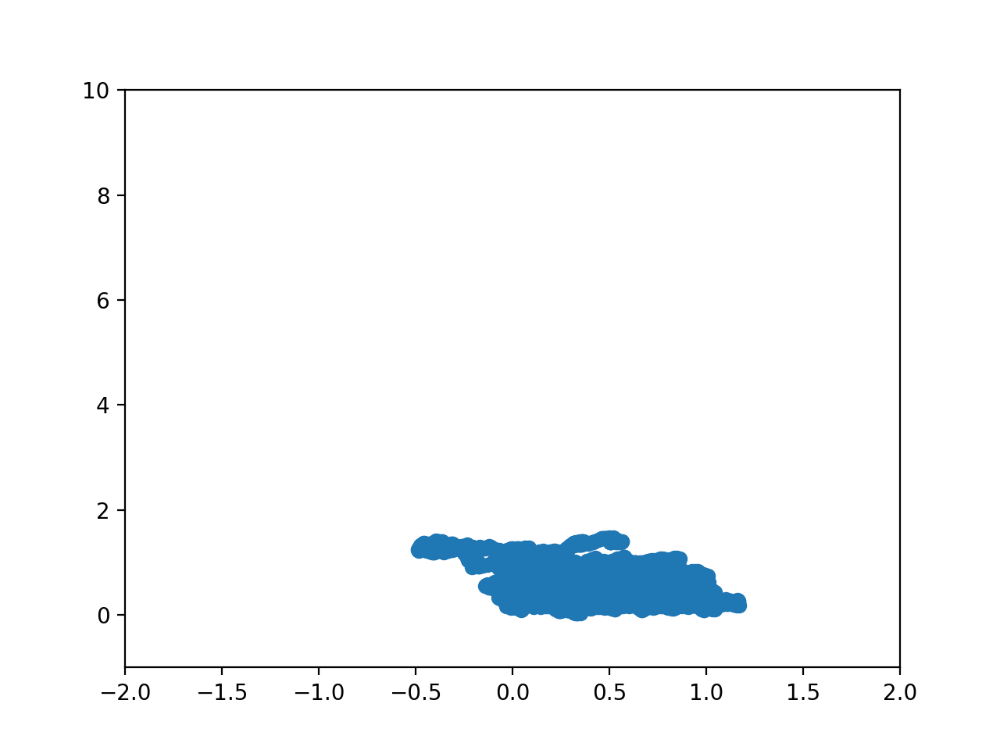

In [17]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML


%matplotlib notebook
fig, ax = plt.subplots()
plt.xlim([-2,2])
plt.ylim([-1,10])

line, = plt.plot([], [], 'o')


def animate(i):
    line.set_data(latent_normal_coord[:,0][:i+1],latent_normal_coord[:,1][:i+1])# update the data.
    return line,


ani = animation.FuncAnimation(
    fig, animate, frames=range(1,120000,100), interval=1, save_count = 10)

#ani.save("./figures/anomaly_walk.gif", writer='imagemagick', fps=100000)

In [ ]:
!ls